In [31]:
#import libraries
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

In [46]:
#read data
df = pd.read_csv('/content/train.csv')

In [60]:
#display the first five rows from the data
df.head()

,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,1,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.0,0.0,0.004883,0.000000,0.025391
1,2,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.0,0.0,0.000977,0.039062,0.022461
2,3,Quercus_Hartwissiana,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.0,0.0,0.000000,0.020508,0.002930
3,5,Tilia_Tomentosa,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.0,0.0,0.017578,0.000000,0.047852
4,6,Quercus_Variabilis,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.031250


In [61]:
#display data dimension
df.shape

(990, 194)

In [62]:
#check null values
print(df.isna().sum().sort_values())

id           0
shape58      0
shape59      0
shape60      0
shape61      0
            ..
shape3       0
shape4       0
shape5       0
margin47     0
texture64    0
Length: 194, dtype: int64


In [63]:
#check duplications and drop them if exist 
df.drop_duplicates()

,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,1,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.000000,0.000000,0.004883,0.000000,0.025391
1,2,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.000000,0.000000,0.000977,0.039062,0.022461
2,3,Quercus_Hartwissiana,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.000000,0.000000,0.000000,0.020508,0.002930
3,5,Tilia_Tomentosa,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.000000,0.000000,0.017578,0.000000,0.047852
4,6,Quercus_Variabilis,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.031250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
985,1575,Magnolia_Salicifolia,0.060547,0.119140,0.007812,0.003906,0.000000,0.148440,0.017578,0.0,...,0.242190,0.000000,0.034180,0.000000,0.010742,0.000000,0.000000,0.000000,0.000000,0.018555
986,1578,Acer_Pictum,0.001953,0.003906,0.021484,0.107420,0.001953,0.000000,0.000000,0.0,...,0.170900,0.000000,0.018555,0.000000,0.011719,0.000000,0.000000,0.000977,0.000000,0.021484
987,1581,Alnus_Maximowiczii,0.001953,0.003906,0.000000,0.021484,0.078125,0.003906,0.007812,0.0,...,0.004883,0.000977,0.004883,0.027344,0.016602,0.007812,0.000000,0.027344,0.000000,0.001953
988,1582,Quercus_Rubra,0.000000,0.000000,0.046875,0.056641,0.009766,0.000000,0.000000,0.0,...,0.083008,0.030273,0.000977,0.002930,0.014648,0.000000,0.041992,0.000000,0.001953,0.002930


In [64]:
#no duplications beause the dimension still the same
df.shape

(990, 194)

array([[<Axes: title={'center': 'id'}>,
        <Axes: title={'center': 'margin1'}>,
        <Axes: title={'center': 'margin2'}>,
        <Axes: title={'center': 'margin3'}>,
        <Axes: title={'center': 'margin4'}>,
        <Axes: title={'center': 'margin5'}>,
        <Axes: title={'center': 'margin6'}>,
        <Axes: title={'center': 'margin7'}>,
        <Axes: title={'center': 'margin8'}>,
        <Axes: title={'center': 'margin9'}>,
        <Axes: title={'center': 'margin10'}>,
        <Axes: title={'center': 'margin11'}>,
        <Axes: title={'center': 'margin12'}>,
        <Axes: title={'center': 'margin13'}>],
       [<Axes: title={'center': 'margin14'}>,
        <Axes: title={'center': 'margin15'}>,
        <Axes: title={'center': 'margin16'}>,
        <Axes: title={'center': 'margin17'}>,
        <Axes: title={'center': 'margin18'}>,
        <Axes: title={'center': 'margin19'}>,
        <Axes: title={'center': 'margin20'}>,
        <Axes: title={'center': 'margin21'}>,
  

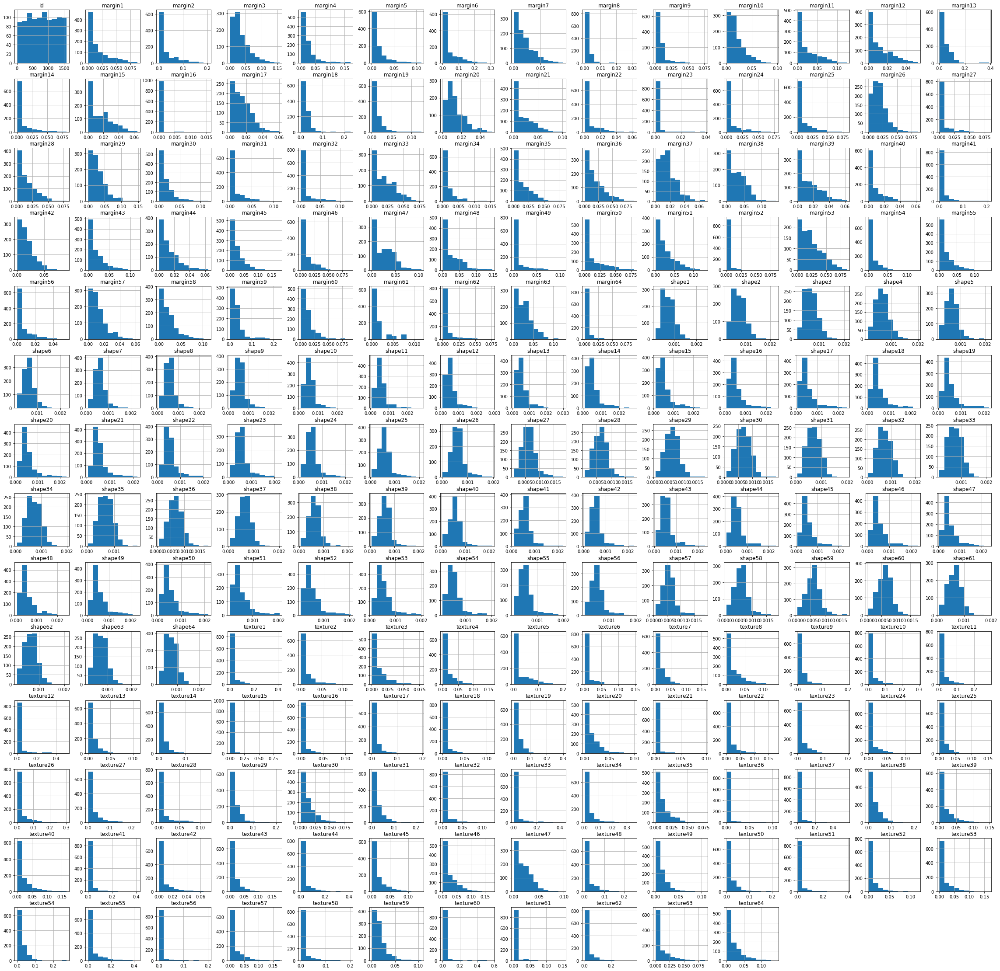

In [9]:
#plot histgran for all features and target
df.hist(figsize=(40,40))

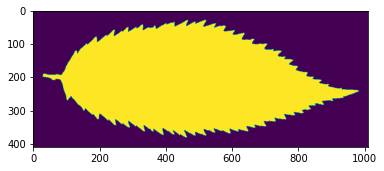

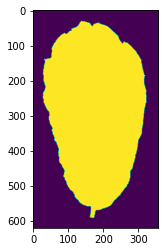

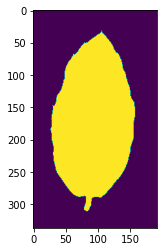

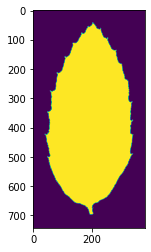

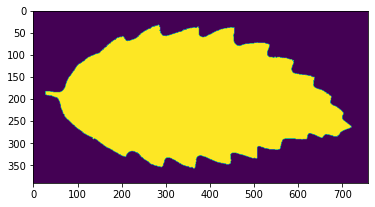

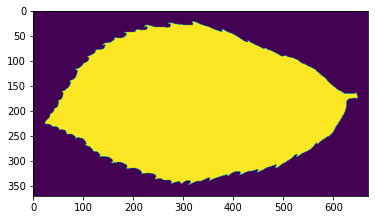

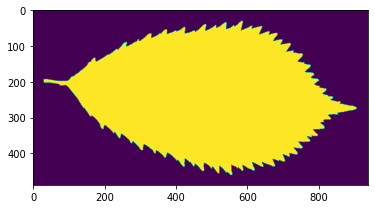

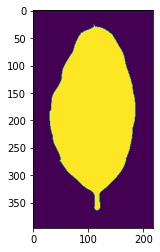

In [65]:
#read and show some images from the data
import matplotlib.image as mpimg
images = ['81','82','83','84','89','90','91','92']
for i in images: 
  img = mpimg.imread('/content/drive/MyDrive/imagess/'+i+'.jpg')
  plt.imshow(img)
  plt.show()

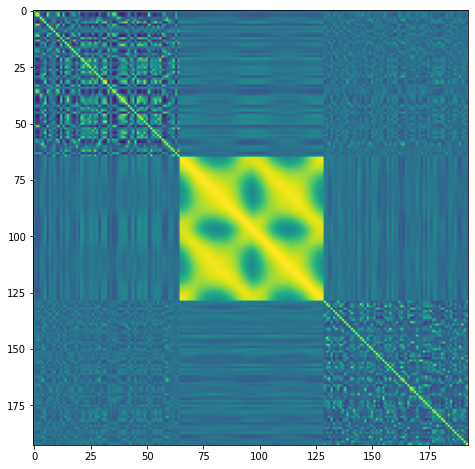

In [33]:
#display correlation heatmap between features
plt.figure(figsize =(8,8))
plt.imshow(df.corr())
plt.show()

In [67]:
#display corrrelation between features
plt.figure(figsize =(8,8))
(df.corr().style.background_gradient())

<Figure size 576x576 with 0 Axes>

In [47]:
#assign target column to y and encoded classe 
#assign features to X and drop id column
y = pd.DataFrame(OneHotEncoder().fit_transform(df[['species']]).toarray())
X = df.drop(['species','id'],axis=1)

In [48]:
#split data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=.2,random_state=42)

In [36]:
#print train features dimensions
X_train.shape

(792, 192)

In [37]:
#print dimension of train label
y_train.shape

(792, 99)

In [38]:
#print standard deviation for the features to check if the data needs standarization or normalization 
# but it was found that the data was not need all values are colse from each other
print(X_train.std())

margin1      0.019840
margin2      0.039481
margin3      0.025302
margin4      0.028378
margin5      0.018455
               ...   
texture60    0.060194
texture61    0.011689
texture62    0.039412
texture63    0.013950
texture64    0.023202
Length: 192, dtype: float64


In [89]:
#print meann for the features to check if the data needs standarization or normalization 
# but it was found that the data was not need all values are colse from each other
print(X_train.mean())

margin1      0.017460
margin2      0.028841
margin3      0.031065
margin4      0.023265
margin5      0.014256
               ...   
texture60    0.013684
texture61    0.002612
texture62    0.019820
texture63    0.009286
texture64    0.019894
Length: 192, dtype: float64


In [90]:
#Describe the data using summary statistics
X_train.describe()

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,...,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000
mean,0.017460,0.028841,0.031065,0.023265,0.014256,0.038229,0.019351,0.001142,0.007122,0.018466,...,0.034414,0.005200,0.016491,0.010726,0.016110,0.013684,0.002612,0.019820,0.009286,0.019894
std,0.019840,0.039481,0.025302,0.028378,0.018455,0.051631,0.017731,0.002869,0.008986,0.015886,...,0.059560,0.019709,0.023981,0.023750,0.015522,0.060194,0.011689,0.039412,0.013950,0.023202
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.001953,0.001953,0.013672,0.005859,0.001953,0.000000,0.005859,0.000000,0.000000,0.005859,...,0.000000,0.000000,0.000977,0.000000,0.004883,0.000000,0.000000,0.000000,0.000000,0.000977
50%,0.009766,0.011719,0.023438,0.013672,0.007812,0.014649,0.015625,0.000000,0.005859,0.015625,...,0.003906,0.000000,0.006836,0.000977,0.012695,0.000000,0.000000,0.003906,0.002930,0.011719
75%,0.025391,0.039551,0.042969,0.029297,0.019531,0.054688,0.029297,0.000000,0.007812,0.027344,...,0.040283,0.000000,0.021484,0.008789,0.021484,0.000000,0.000000,0.022461,0.013672,0.029541
max,0.085938,0.205080,0.138670,0.169920,0.111330,0.275390,0.091797,0.031250,0.076172,0.097656,...,0.375980,0.202150,0.172850,0.200200,0.106450,0.578130,0.151370,0.375980,0.082031,0.141600


In [51]:
model = Sequential()
model.add(Dense(512, activation='tanh',kernel_initializer='glorot_uniform',input_shape=(X_train.shape[1],)))
model.add(Dense(99, activation='softmax'))
model.summary()

Model: "sequential_92"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_184 (Dense)           (None, 512)               98816     
                                                                 
 dense_185 (Dense)           (None, 99)                50787     
                                                                 
Total params: 149,603
Trainable params: 149,603
Non-trainable params: 0
_________________________________________________________________


In [52]:
model.compile( loss='CategoricalCrossentropy',optimizer='adam', metrics=['accuracy'])

In [53]:
model = model.fit(X_train, y_train, validation_split = 0.1,epochs = 100, batch_size = 32)

Epoch 1/100
23/23 [==============================] - 1s 17ms/step - loss: 4.5582 - accuracy: 0.1025 - val_loss: 4.4997 - val_accuracy: 0.2375
Epoch 2/100
23/23 [==============================] - 0s 8ms/step - loss: 4.4252 - accuracy: 0.3652 - val_loss: 4.3874 - val_accuracy: 0.1625
Epoch 3/100
23/23 [==============================] - 0s 11ms/step - loss: 4.2570 - accuracy: 0.4129 - val_loss: 4.2138 - val_accuracy: 0.2125
Epoch 4/100
23/23 [==============================] - 0s 12ms/step - loss: 4.0173 - accuracy: 0.4452 - val_loss: 3.9639 - val_accuracy: 0.2375
Epoch 5/100
23/23 [==============================] - 0s 11ms/step - loss: 3.7016 - accuracy: 0.4874 - val_loss: 3.6630 - val_accuracy: 0.2375
Epoch 6/100
23/23 [==============================] - 0s 11ms/step - loss: 3.3470 - accuracy: 0.5197 - val_loss: 3.3448 - val_accuracy: 0.3250
Epoch 7/100
23/23 [==============================] - 0s 11ms/step - loss: 2.9898 - accuracy: 0.5801 - val_loss: 3.0521 - val_accuracy: 0.3875
Epoch 8

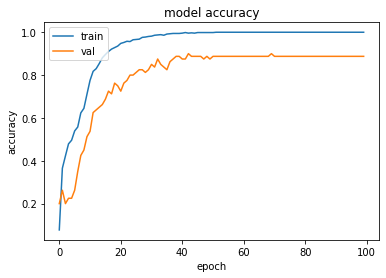

In [42]:
#plot accuracy
plt.plot(model.history['accuracy'])
plt.plot(model.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

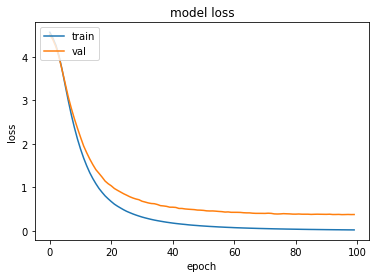

In [44]:
#plot loss
plt.plot(model.history['loss'])
plt.plot(model.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [12]:
#implement function for plot accuracy
def plot_acuraccy(model):
  plt.plot(modell.history['accuracy'])
  plt.plot(modell.history['val_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper left')
  plt.show()

In [13]:
#implement function for pot loss
def plot_loss(model):
  plt.plot(modell.history['loss'])
  plt.plot(modell.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'val'], loc='upper left')
  plt.show()

Epoch 1/100
36/36 [==============================] - 1s 12ms/step - loss: 4.5987 - accuracy: 0.0056 - val_loss: 4.6001 - val_accuracy: 0.0000e+00
Epoch 2/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5981 - accuracy: 0.0028 - val_loss: 4.6004 - val_accuracy: 0.0000e+00
Epoch 3/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5965 - accuracy: 0.0098 - val_loss: 4.6005 - val_accuracy: 0.0000e+00
Epoch 4/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5960 - accuracy: 0.0070 - val_loss: 4.6006 - val_accuracy: 0.0000e+00
Epoch 5/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5952 - accuracy: 0.0084 - val_loss: 4.6005 - val_accuracy: 0.0000e+00
Epoch 6/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5945 - accuracy: 0.0028 - val_loss: 4.6003 - val_accuracy: 0.0000e+00
Epoch 7/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5943 - accuracy: 0.0042 - val_loss: 4.6005 - val_accur

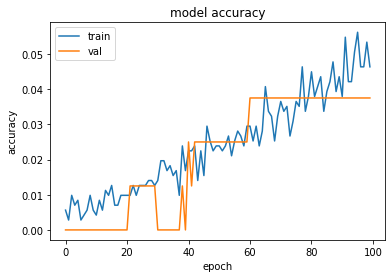

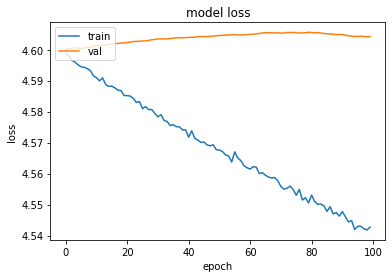

Epoch 1/100
29/29 [==============================] - 1s 15ms/step - loss: 4.5942 - accuracy: 0.0084 - val_loss: 4.5924 - val_accuracy: 0.0250
Epoch 2/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5929 - accuracy: 0.0098 - val_loss: 4.5928 - val_accuracy: 0.0125
Epoch 3/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5939 - accuracy: 0.0070 - val_loss: 4.5931 - val_accuracy: 0.0125
Epoch 4/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5935 - accuracy: 0.0098 - val_loss: 4.5935 - val_accuracy: 0.0125
Epoch 5/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5923 - accuracy: 0.0126 - val_loss: 4.5938 - val_accuracy: 0.0125
Epoch 6/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5909 - accuracy: 0.0070 - val_loss: 4.5941 - val_accuracy: 0.0125
Epoch 7/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5912 - accuracy: 0.0126 - val_loss: 4.5944 - val_accuracy: 0.0125
Epoch 8/100


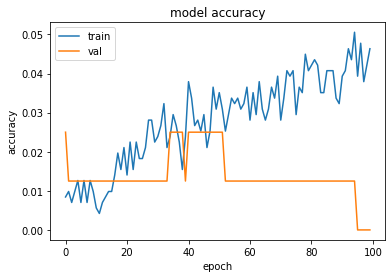

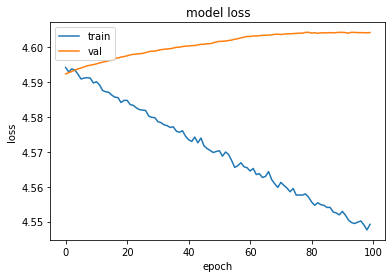

Epoch 1/100
24/24 [==============================] - 1s 19ms/step - loss: 4.5914 - accuracy: 0.0169 - val_loss: 4.5902 - val_accuracy: 0.0125
Epoch 2/100
24/24 [==============================] - 0s 6ms/step - loss: 4.5920 - accuracy: 0.0098 - val_loss: 4.5903 - val_accuracy: 0.0125
Epoch 3/100
24/24 [==============================] - 0s 6ms/step - loss: 4.5914 - accuracy: 0.0154 - val_loss: 4.5904 - val_accuracy: 0.0125
Epoch 4/100
24/24 [==============================] - 0s 6ms/step - loss: 4.5906 - accuracy: 0.0239 - val_loss: 4.5904 - val_accuracy: 0.0125
Epoch 5/100
24/24 [==============================] - 0s 6ms/step - loss: 4.5894 - accuracy: 0.0183 - val_loss: 4.5904 - val_accuracy: 0.0125
Epoch 6/100
24/24 [==============================] - 0s 5ms/step - loss: 4.5887 - accuracy: 0.0169 - val_loss: 4.5905 - val_accuracy: 0.0125
Epoch 7/100
24/24 [==============================] - 0s 5ms/step - loss: 4.5888 - accuracy: 0.0281 - val_loss: 4.5905 - val_accuracy: 0.0125
Epoch 8/100


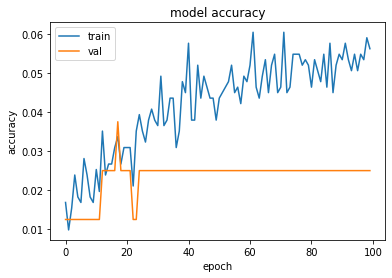

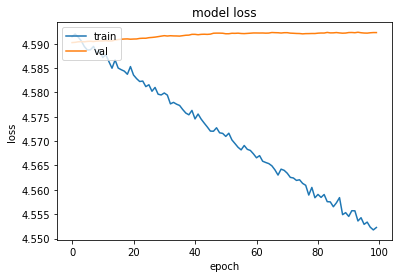

Epoch 1/100
36/36 [==============================] - 1s 8ms/step - loss: 4.5818 - accuracy: 0.0281 - val_loss: 4.5518 - val_accuracy: 0.0875
Epoch 2/100
36/36 [==============================] - 0s 3ms/step - loss: 4.5207 - accuracy: 0.1854 - val_loss: 4.5056 - val_accuracy: 0.1875
Epoch 3/100
36/36 [==============================] - 0s 4ms/step - loss: 4.4486 - accuracy: 0.3090 - val_loss: 4.4361 - val_accuracy: 0.2000
Epoch 4/100
36/36 [==============================] - 0s 3ms/step - loss: 4.3502 - accuracy: 0.3596 - val_loss: 4.3346 - val_accuracy: 0.2125
Epoch 5/100
36/36 [==============================] - 0s 4ms/step - loss: 4.2144 - accuracy: 0.3989 - val_loss: 4.2000 - val_accuracy: 0.2250
Epoch 6/100
36/36 [==============================] - 0s 3ms/step - loss: 4.0377 - accuracy: 0.4256 - val_loss: 4.0312 - val_accuracy: 0.2125
Epoch 7/100
36/36 [==============================] - 0s 3ms/step - loss: 3.8258 - accuracy: 0.4228 - val_loss: 3.8422 - val_accuracy: 0.2000
Epoch 8/100
3

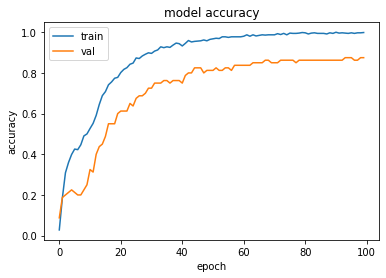

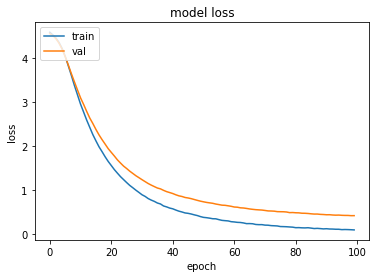

Epoch 1/100
29/29 [==============================] - 1s 11ms/step - loss: 4.5824 - accuracy: 0.0337 - val_loss: 4.5726 - val_accuracy: 0.0250
Epoch 2/100
29/29 [==============================] - 0s 4ms/step - loss: 4.5312 - accuracy: 0.1545 - val_loss: 4.5305 - val_accuracy: 0.1250
Epoch 3/100
29/29 [==============================] - 0s 5ms/step - loss: 4.4724 - accuracy: 0.3132 - val_loss: 4.4769 - val_accuracy: 0.1750
Epoch 4/100
29/29 [==============================] - 0s 5ms/step - loss: 4.3956 - accuracy: 0.3666 - val_loss: 4.4043 - val_accuracy: 0.2250
Epoch 5/100
29/29 [==============================] - 0s 4ms/step - loss: 4.2912 - accuracy: 0.4242 - val_loss: 4.3029 - val_accuracy: 0.2375
Epoch 6/100
29/29 [==============================] - 0s 4ms/step - loss: 4.1576 - accuracy: 0.4298 - val_loss: 4.1750 - val_accuracy: 0.2625
Epoch 7/100
29/29 [==============================] - 0s 4ms/step - loss: 3.9859 - accuracy: 0.4424 - val_loss: 4.0257 - val_accuracy: 0.2500
Epoch 8/100


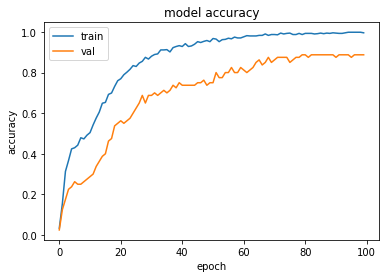

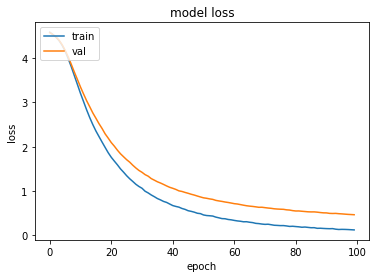

Epoch 1/100
24/24 [==============================] - 1s 13ms/step - loss: 4.5853 - accuracy: 0.0337 - val_loss: 4.5679 - val_accuracy: 0.1250
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 4.5399 - accuracy: 0.1376 - val_loss: 4.5353 - val_accuracy: 0.1750
Epoch 3/100
24/24 [==============================] - 0s 5ms/step - loss: 4.4878 - accuracy: 0.2570 - val_loss: 4.4872 - val_accuracy: 0.2125
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 4.4247 - accuracy: 0.3160 - val_loss: 4.4299 - val_accuracy: 0.2250
Epoch 5/100
24/24 [==============================] - 0s 5ms/step - loss: 4.3376 - accuracy: 0.3736 - val_loss: 4.3497 - val_accuracy: 0.2000
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 4.2309 - accuracy: 0.3666 - val_loss: 4.2486 - val_accuracy: 0.2000
Epoch 7/100
24/24 [==============================] - 0s 5ms/step - loss: 4.0981 - accuracy: 0.4185 - val_loss: 4.1250 - val_accuracy: 0.2250
Epoch 8/100


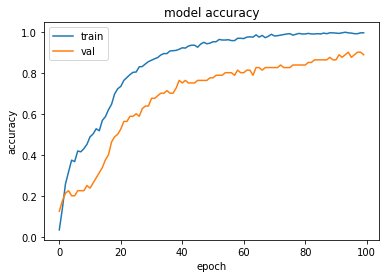

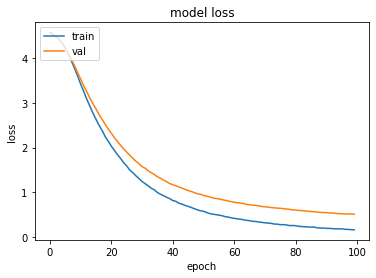

Epoch 1/100
36/36 [==============================] - 1s 9ms/step - loss: 4.5765 - accuracy: 0.0365 - val_loss: 4.5601 - val_accuracy: 0.0625
Epoch 2/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5276 - accuracy: 0.1489 - val_loss: 4.5212 - val_accuracy: 0.1000
Epoch 3/100
36/36 [==============================] - 0s 3ms/step - loss: 4.4705 - accuracy: 0.2458 - val_loss: 4.4714 - val_accuracy: 0.1375
Epoch 4/100
36/36 [==============================] - 0s 3ms/step - loss: 4.3990 - accuracy: 0.2992 - val_loss: 4.4074 - val_accuracy: 0.1500
Epoch 5/100
36/36 [==============================] - 0s 3ms/step - loss: 4.3162 - accuracy: 0.3006 - val_loss: 4.3300 - val_accuracy: 0.1625
Epoch 6/100
36/36 [==============================] - 0s 4ms/step - loss: 4.2127 - accuracy: 0.3062 - val_loss: 4.2419 - val_accuracy: 0.1250
Epoch 7/100
36/36 [==============================] - 0s 4ms/step - loss: 4.0923 - accuracy: 0.3469 - val_loss: 4.1384 - val_accuracy: 0.1375
Epoch 8/100
3

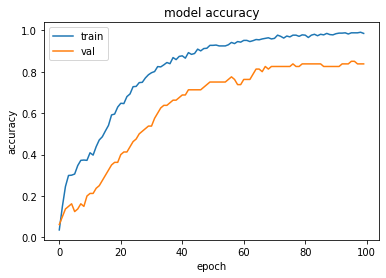

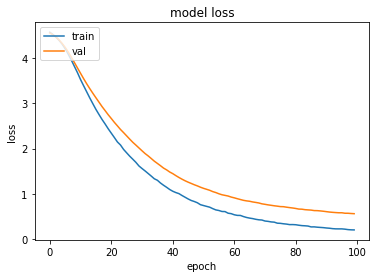

Epoch 1/100
29/29 [==============================] - 1s 11ms/step - loss: 4.5818 - accuracy: 0.0351 - val_loss: 4.5656 - val_accuracy: 0.0375
Epoch 2/100
29/29 [==============================] - 0s 4ms/step - loss: 4.5388 - accuracy: 0.1236 - val_loss: 4.5328 - val_accuracy: 0.1000
Epoch 3/100
29/29 [==============================] - 0s 5ms/step - loss: 4.4901 - accuracy: 0.2458 - val_loss: 4.4923 - val_accuracy: 0.1375
Epoch 4/100
29/29 [==============================] - 0s 4ms/step - loss: 4.4329 - accuracy: 0.2865 - val_loss: 4.4408 - val_accuracy: 0.1500
Epoch 5/100
29/29 [==============================] - 0s 4ms/step - loss: 4.3636 - accuracy: 0.3062 - val_loss: 4.3791 - val_accuracy: 0.2000
Epoch 6/100
29/29 [==============================] - 0s 4ms/step - loss: 4.2815 - accuracy: 0.3511 - val_loss: 4.3087 - val_accuracy: 0.2125
Epoch 7/100
29/29 [==============================] - 0s 4ms/step - loss: 4.1857 - accuracy: 0.3497 - val_loss: 4.2223 - val_accuracy: 0.2250
Epoch 8/100


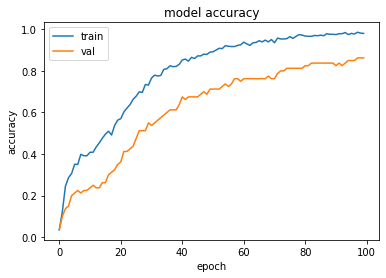

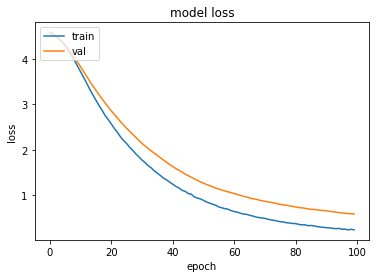

Epoch 1/100
24/24 [==============================] - 1s 12ms/step - loss: 4.5864 - accuracy: 0.0211 - val_loss: 4.5752 - val_accuracy: 0.0250
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 4.5476 - accuracy: 0.1222 - val_loss: 4.5489 - val_accuracy: 0.0625
Epoch 3/100
24/24 [==============================] - 0s 5ms/step - loss: 4.5088 - accuracy: 0.1938 - val_loss: 4.5188 - val_accuracy: 0.1125
Epoch 4/100
24/24 [==============================] - 0s 6ms/step - loss: 4.4630 - accuracy: 0.2570 - val_loss: 4.4822 - val_accuracy: 0.1625
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 4.4077 - accuracy: 0.2865 - val_loss: 4.4368 - val_accuracy: 0.1375
Epoch 6/100
24/24 [==============================] - 0s 5ms/step - loss: 4.3452 - accuracy: 0.3244 - val_loss: 4.3811 - val_accuracy: 0.1750
Epoch 7/100
24/24 [==============================] - 0s 5ms/step - loss: 4.2687 - accuracy: 0.3441 - val_loss: 4.3156 - val_accuracy: 0.1750
Epoch 8/100


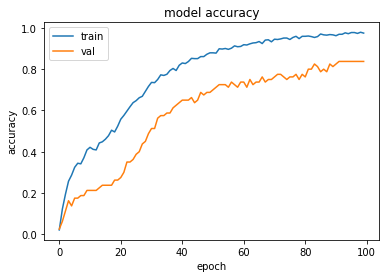

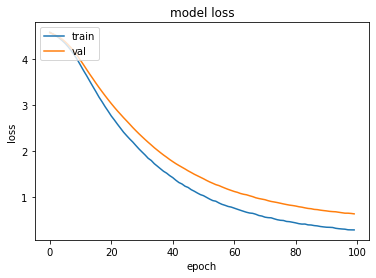

Epoch 1/100
36/36 [==============================] - 1s 8ms/step - loss: 4.5936 - accuracy: 0.0126 - val_loss: 4.5925 - val_accuracy: 0.0250
Epoch 2/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5932 - accuracy: 0.0084 - val_loss: 4.5925 - val_accuracy: 0.0250
Epoch 3/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5913 - accuracy: 0.0098 - val_loss: 4.5927 - val_accuracy: 0.0125
Epoch 4/100
36/36 [==============================] - 0s 3ms/step - loss: 4.5925 - accuracy: 0.0126 - val_loss: 4.5929 - val_accuracy: 0.0000e+00
Epoch 5/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5903 - accuracy: 0.0140 - val_loss: 4.5931 - val_accuracy: 0.0125
Epoch 6/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5889 - accuracy: 0.0098 - val_loss: 4.5934 - val_accuracy: 0.0125
Epoch 7/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5889 - accuracy: 0.0140 - val_loss: 4.5937 - val_accuracy: 0.0125
Epoch 8/1

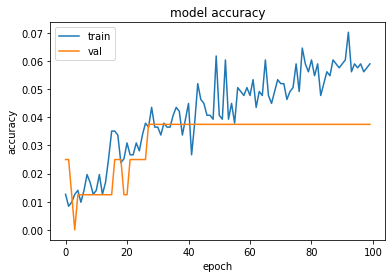

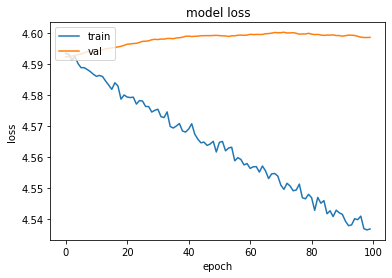

Epoch 1/100
29/29 [==============================] - 1s 10ms/step - loss: 4.5940 - accuracy: 0.0112 - val_loss: 4.5920 - val_accuracy: 0.0125
Epoch 2/100
29/29 [==============================] - 0s 4ms/step - loss: 4.5927 - accuracy: 0.0098 - val_loss: 4.5923 - val_accuracy: 0.0125
Epoch 3/100
29/29 [==============================] - 0s 4ms/step - loss: 4.5925 - accuracy: 0.0112 - val_loss: 4.5926 - val_accuracy: 0.0125
Epoch 4/100
29/29 [==============================] - 0s 4ms/step - loss: 4.5919 - accuracy: 0.0183 - val_loss: 4.5928 - val_accuracy: 0.0125
Epoch 5/100
29/29 [==============================] - 0s 4ms/step - loss: 4.5922 - accuracy: 0.0112 - val_loss: 4.5933 - val_accuracy: 0.0125
Epoch 6/100
29/29 [==============================] - 0s 4ms/step - loss: 4.5910 - accuracy: 0.0154 - val_loss: 4.5936 - val_accuracy: 0.0125
Epoch 7/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5917 - accuracy: 0.0098 - val_loss: 4.5937 - val_accuracy: 0.0125
Epoch 8/100


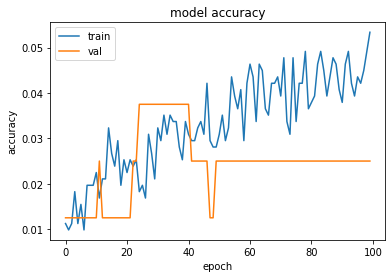

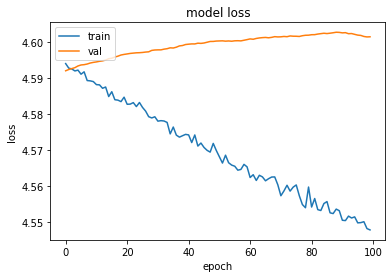

Epoch 1/100
24/24 [==============================] - 1s 12ms/step - loss: 4.5919 - accuracy: 0.0154 - val_loss: 4.5975 - val_accuracy: 0.0250
Epoch 2/100
24/24 [==============================] - 0s 4ms/step - loss: 4.5921 - accuracy: 0.0211 - val_loss: 4.5976 - val_accuracy: 0.0250
Epoch 3/100
24/24 [==============================] - 0s 5ms/step - loss: 4.5920 - accuracy: 0.0112 - val_loss: 4.5978 - val_accuracy: 0.0250
Epoch 4/100
24/24 [==============================] - 0s 4ms/step - loss: 4.5912 - accuracy: 0.0253 - val_loss: 4.5980 - val_accuracy: 0.0250
Epoch 5/100
24/24 [==============================] - 0s 4ms/step - loss: 4.5907 - accuracy: 0.0281 - val_loss: 4.5984 - val_accuracy: 0.0125
Epoch 6/100
24/24 [==============================] - 0s 4ms/step - loss: 4.5924 - accuracy: 0.0197 - val_loss: 4.5985 - val_accuracy: 0.0250
Epoch 7/100
24/24 [==============================] - 0s 4ms/step - loss: 4.5899 - accuracy: 0.0197 - val_loss: 4.5987 - val_accuracy: 0.0250
Epoch 8/100


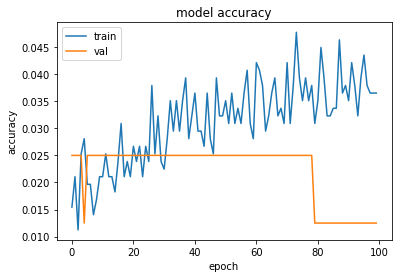

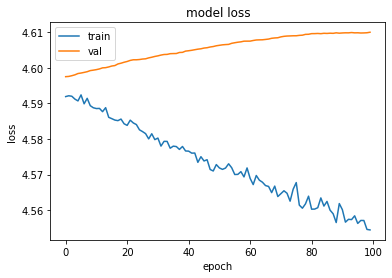

Epoch 1/100
36/36 [==============================] - 1s 9ms/step - loss: 4.5816 - accuracy: 0.0295 - val_loss: 4.5603 - val_accuracy: 0.0875
Epoch 2/100
36/36 [==============================] - 0s 3ms/step - loss: 4.5301 - accuracy: 0.1320 - val_loss: 4.5222 - val_accuracy: 0.1000
Epoch 3/100
36/36 [==============================] - 0s 4ms/step - loss: 4.4702 - accuracy: 0.2289 - val_loss: 4.4667 - val_accuracy: 0.1125
Epoch 4/100
36/36 [==============================] - 0s 4ms/step - loss: 4.3910 - accuracy: 0.2879 - val_loss: 4.3907 - val_accuracy: 0.1375
Epoch 5/100
36/36 [==============================] - 0s 4ms/step - loss: 4.2841 - accuracy: 0.3104 - val_loss: 4.2858 - val_accuracy: 0.1875
Epoch 6/100
36/36 [==============================] - 0s 4ms/step - loss: 4.1462 - accuracy: 0.3497 - val_loss: 4.1580 - val_accuracy: 0.1750
Epoch 7/100
36/36 [==============================] - 0s 4ms/step - loss: 3.9787 - accuracy: 0.3947 - val_loss: 4.0046 - val_accuracy: 0.1875
Epoch 8/100
3

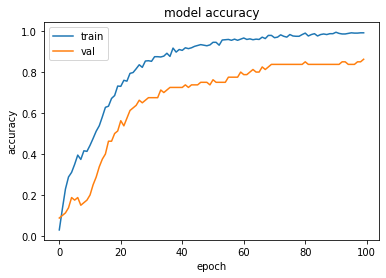

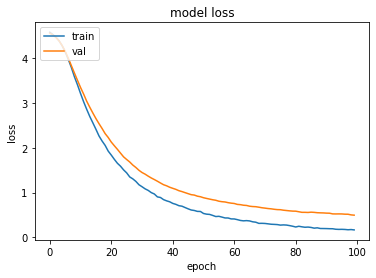

Epoch 1/100
29/29 [==============================] - 2s 17ms/step - loss: 4.5835 - accuracy: 0.0225 - val_loss: 4.5645 - val_accuracy: 0.0750
Epoch 2/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5363 - accuracy: 0.1124 - val_loss: 4.5269 - val_accuracy: 0.1875
Epoch 3/100
29/29 [==============================] - 0s 6ms/step - loss: 4.4879 - accuracy: 0.2163 - val_loss: 4.4809 - val_accuracy: 0.1750
Epoch 4/100
29/29 [==============================] - 0s 6ms/step - loss: 4.4216 - accuracy: 0.2570 - val_loss: 4.4210 - val_accuracy: 0.1625
Epoch 5/100
29/29 [==============================] - 0s 8ms/step - loss: 4.3457 - accuracy: 0.2935 - val_loss: 4.3414 - val_accuracy: 0.2000
Epoch 6/100
29/29 [==============================] - 0s 7ms/step - loss: 4.2360 - accuracy: 0.3525 - val_loss: 4.2443 - val_accuracy: 0.2000
Epoch 7/100
29/29 [==============================] - 0s 6ms/step - loss: 4.1088 - accuracy: 0.3497 - val_loss: 4.1216 - val_accuracy: 0.1875
Epoch 8/100


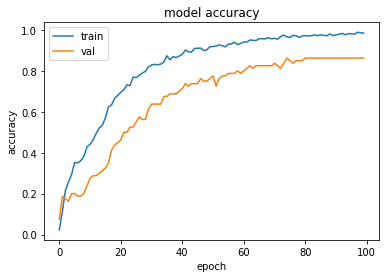

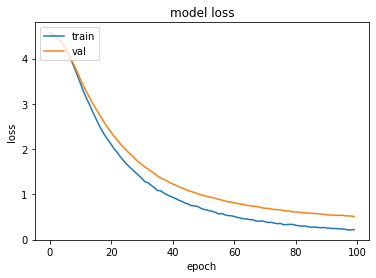

Epoch 1/100
24/24 [==============================] - 1s 17ms/step - loss: 4.5882 - accuracy: 0.0211 - val_loss: 4.5746 - val_accuracy: 0.0500
Epoch 2/100
24/24 [==============================] - 0s 7ms/step - loss: 4.5475 - accuracy: 0.1081 - val_loss: 4.5478 - val_accuracy: 0.1000
Epoch 3/100
24/24 [==============================] - 0s 8ms/step - loss: 4.5078 - accuracy: 0.1952 - val_loss: 4.5117 - val_accuracy: 0.1625
Epoch 4/100
24/24 [==============================] - 0s 7ms/step - loss: 4.4580 - accuracy: 0.2683 - val_loss: 4.4680 - val_accuracy: 0.1375
Epoch 5/100
24/24 [==============================] - 0s 6ms/step - loss: 4.3916 - accuracy: 0.3076 - val_loss: 4.4128 - val_accuracy: 0.1500
Epoch 6/100
24/24 [==============================] - 0s 5ms/step - loss: 4.3122 - accuracy: 0.3329 - val_loss: 4.3371 - val_accuracy: 0.1625
Epoch 7/100
24/24 [==============================] - 0s 5ms/step - loss: 4.2174 - accuracy: 0.3385 - val_loss: 4.2465 - val_accuracy: 0.1375
Epoch 8/100


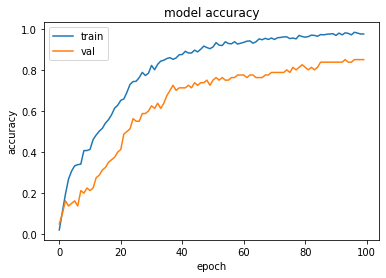

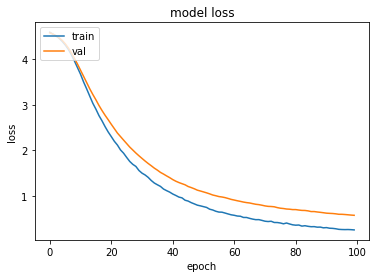

Epoch 1/100
36/36 [==============================] - 1s 9ms/step - loss: 4.5882 - accuracy: 0.0197 - val_loss: 4.5605 - val_accuracy: 0.0750
Epoch 2/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5464 - accuracy: 0.1011 - val_loss: 4.5295 - val_accuracy: 0.1000
Epoch 3/100
36/36 [==============================] - 0s 3ms/step - loss: 4.5020 - accuracy: 0.1713 - val_loss: 4.4898 - val_accuracy: 0.1250
Epoch 4/100
36/36 [==============================] - 0s 4ms/step - loss: 4.4478 - accuracy: 0.2093 - val_loss: 4.4425 - val_accuracy: 0.1250
Epoch 5/100
36/36 [==============================] - 0s 4ms/step - loss: 4.3823 - accuracy: 0.2430 - val_loss: 4.3835 - val_accuracy: 0.1375
Epoch 6/100
36/36 [==============================] - 0s 4ms/step - loss: 4.3041 - accuracy: 0.2612 - val_loss: 4.3140 - val_accuracy: 0.1375
Epoch 7/100
36/36 [==============================] - 0s 5ms/step - loss: 4.2170 - accuracy: 0.2865 - val_loss: 4.2324 - val_accuracy: 0.1375
Epoch 8/100
3

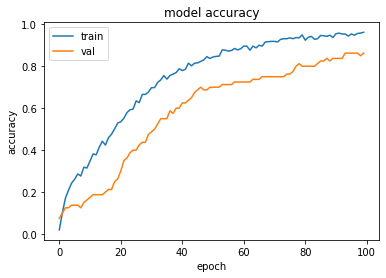

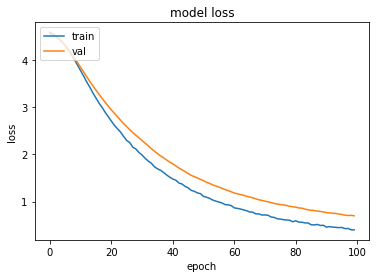

Epoch 1/100
29/29 [==============================] - 1s 17ms/step - loss: 4.5806 - accuracy: 0.0421 - val_loss: 4.5728 - val_accuracy: 0.0750
Epoch 2/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5436 - accuracy: 0.1025 - val_loss: 4.5462 - val_accuracy: 0.1000
Epoch 3/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5063 - accuracy: 0.1559 - val_loss: 4.5162 - val_accuracy: 0.1250
Epoch 4/100
29/29 [==============================] - 0s 6ms/step - loss: 4.4593 - accuracy: 0.2051 - val_loss: 4.4781 - val_accuracy: 0.1250
Epoch 5/100
29/29 [==============================] - 0s 7ms/step - loss: 4.4079 - accuracy: 0.2289 - val_loss: 4.4337 - val_accuracy: 0.1375
Epoch 6/100
29/29 [==============================] - 0s 8ms/step - loss: 4.3418 - accuracy: 0.2472 - val_loss: 4.3788 - val_accuracy: 0.1250
Epoch 7/100
29/29 [==============================] - 0s 7ms/step - loss: 4.2711 - accuracy: 0.2654 - val_loss: 4.3141 - val_accuracy: 0.1250
Epoch 8/100


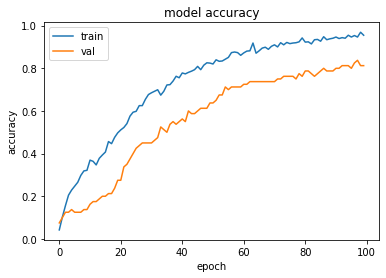

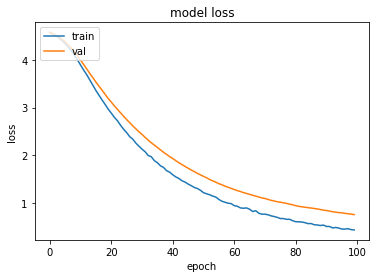

Epoch 1/100
24/24 [==============================] - 1s 19ms/step - loss: 4.5848 - accuracy: 0.0295 - val_loss: 4.5710 - val_accuracy: 0.0625
Epoch 2/100
24/24 [==============================] - 0s 8ms/step - loss: 4.5494 - accuracy: 0.1053 - val_loss: 4.5474 - val_accuracy: 0.1000
Epoch 3/100
24/24 [==============================] - 0s 7ms/step - loss: 4.5132 - accuracy: 0.2065 - val_loss: 4.5189 - val_accuracy: 0.1750
Epoch 4/100
24/24 [==============================] - 0s 6ms/step - loss: 4.4753 - accuracy: 0.2303 - val_loss: 4.4861 - val_accuracy: 0.2125
Epoch 5/100
24/24 [==============================] - 0s 7ms/step - loss: 4.4261 - accuracy: 0.2809 - val_loss: 4.4461 - val_accuracy: 0.2000
Epoch 6/100
24/24 [==============================] - 0s 7ms/step - loss: 4.3704 - accuracy: 0.3146 - val_loss: 4.3999 - val_accuracy: 0.2125
Epoch 7/100
24/24 [==============================] - 0s 6ms/step - loss: 4.3107 - accuracy: 0.3287 - val_loss: 4.3462 - val_accuracy: 0.2250
Epoch 8/100


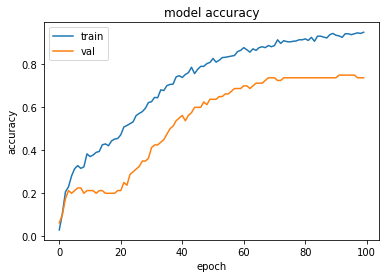

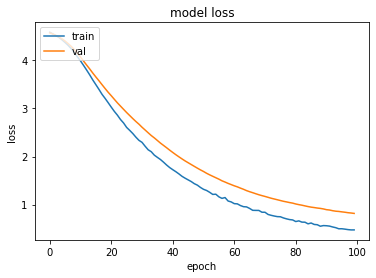

Epoch 1/100
36/36 [==============================] - 1s 8ms/step - loss: 4.5962 - accuracy: 0.0014 - val_loss: 4.5922 - val_accuracy: 0.0125
Epoch 2/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5963 - accuracy: 0.0098 - val_loss: 4.5922 - val_accuracy: 0.0125
Epoch 3/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5921 - accuracy: 0.0126 - val_loss: 4.5921 - val_accuracy: 0.0125
Epoch 4/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5929 - accuracy: 0.0084 - val_loss: 4.5920 - val_accuracy: 0.0125
Epoch 5/100
36/36 [==============================] - 0s 3ms/step - loss: 4.5970 - accuracy: 0.0056 - val_loss: 4.5921 - val_accuracy: 0.0125
Epoch 6/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5929 - accuracy: 0.0112 - val_loss: 4.5923 - val_accuracy: 0.0125
Epoch 7/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5929 - accuracy: 0.0070 - val_loss: 4.5923 - val_accuracy: 0.0125
Epoch 8/100
3

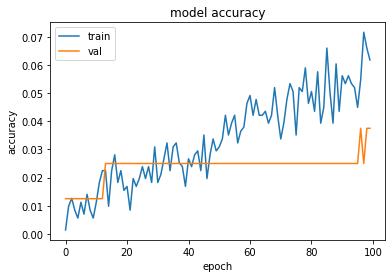

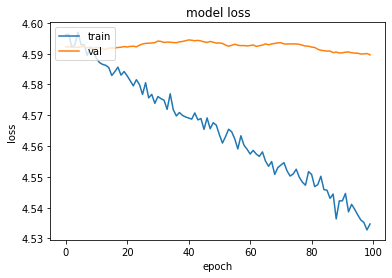

Epoch 1/100
29/29 [==============================] - 1s 17ms/step - loss: 4.5959 - accuracy: 0.0070 - val_loss: 4.5913 - val_accuracy: 0.0000e+00
Epoch 2/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5954 - accuracy: 0.0169 - val_loss: 4.5917 - val_accuracy: 0.0000e+00
Epoch 3/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5940 - accuracy: 0.0126 - val_loss: 4.5920 - val_accuracy: 0.0000e+00
Epoch 4/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5939 - accuracy: 0.0112 - val_loss: 4.5922 - val_accuracy: 0.0000e+00
Epoch 5/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5937 - accuracy: 0.0098 - val_loss: 4.5924 - val_accuracy: 0.0000e+00
Epoch 6/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5917 - accuracy: 0.0183 - val_loss: 4.5930 - val_accuracy: 0.0000e+00
Epoch 7/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5915 - accuracy: 0.0154 - val_loss: 4.5932 - val_accur

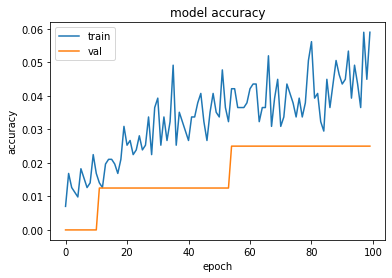

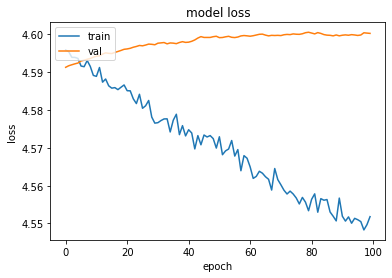

Epoch 1/100
24/24 [==============================] - 1s 17ms/step - loss: 4.5938 - accuracy: 0.0084 - val_loss: 4.5880 - val_accuracy: 0.0000e+00
Epoch 2/100
24/24 [==============================] - 0s 7ms/step - loss: 4.5943 - accuracy: 0.0084 - val_loss: 4.5883 - val_accuracy: 0.0125
Epoch 3/100
24/24 [==============================] - 0s 8ms/step - loss: 4.5928 - accuracy: 0.0126 - val_loss: 4.5884 - val_accuracy: 0.0125
Epoch 4/100
24/24 [==============================] - 0s 7ms/step - loss: 4.5925 - accuracy: 0.0154 - val_loss: 4.5885 - val_accuracy: 0.0125
Epoch 5/100
24/24 [==============================] - 0s 6ms/step - loss: 4.5911 - accuracy: 0.0154 - val_loss: 4.5889 - val_accuracy: 0.0125
Epoch 6/100
24/24 [==============================] - 0s 6ms/step - loss: 4.5880 - accuracy: 0.0126 - val_loss: 4.5890 - val_accuracy: 0.0125
Epoch 7/100
24/24 [==============================] - 0s 7ms/step - loss: 4.5893 - accuracy: 0.0126 - val_loss: 4.5893 - val_accuracy: 0.0125
Epoch 8/

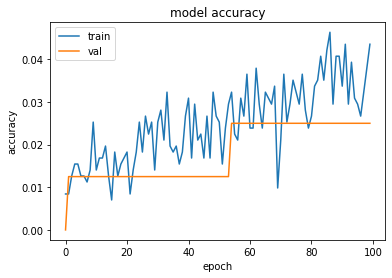

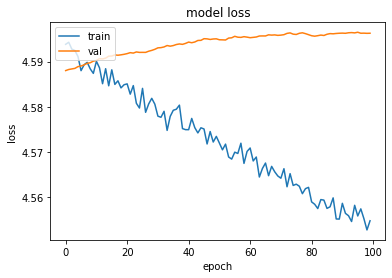

Epoch 1/100
36/36 [==============================] - 1s 15ms/step - loss: 4.5855 - accuracy: 0.0281 - val_loss: 4.5659 - val_accuracy: 0.0875
Epoch 2/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5425 - accuracy: 0.0941 - val_loss: 4.5348 - val_accuracy: 0.1125
Epoch 3/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5004 - accuracy: 0.1236 - val_loss: 4.4974 - val_accuracy: 0.1750
Epoch 4/100
36/36 [==============================] - 0s 6ms/step - loss: 4.4407 - accuracy: 0.2093 - val_loss: 4.4442 - val_accuracy: 0.1875
Epoch 5/100
36/36 [==============================] - 0s 5ms/step - loss: 4.3741 - accuracy: 0.2317 - val_loss: 4.3812 - val_accuracy: 0.1875
Epoch 6/100
36/36 [==============================] - 0s 6ms/step - loss: 4.2825 - accuracy: 0.2697 - val_loss: 4.3023 - val_accuracy: 0.1875
Epoch 7/100
36/36 [==============================] - 0s 6ms/step - loss: 4.1746 - accuracy: 0.2963 - val_loss: 4.1985 - val_accuracy: 0.2000
Epoch 8/100


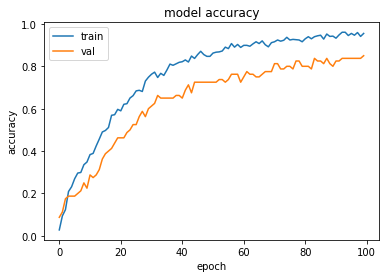

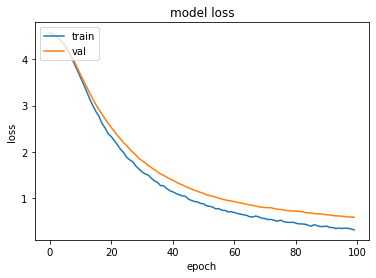

Epoch 1/100
29/29 [==============================] - 1s 31ms/step - loss: 4.5886 - accuracy: 0.0126 - val_loss: 4.5755 - val_accuracy: 0.0250
Epoch 2/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5499 - accuracy: 0.0618 - val_loss: 4.5495 - val_accuracy: 0.0875
Epoch 3/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5110 - accuracy: 0.1166 - val_loss: 4.5190 - val_accuracy: 0.1625
Epoch 4/100
29/29 [==============================] - 0s 5ms/step - loss: 4.4642 - accuracy: 0.1770 - val_loss: 4.4800 - val_accuracy: 0.1750
Epoch 5/100
29/29 [==============================] - 0s 5ms/step - loss: 4.4103 - accuracy: 0.2247 - val_loss: 4.4283 - val_accuracy: 0.1875
Epoch 6/100
29/29 [==============================] - 0s 5ms/step - loss: 4.3393 - accuracy: 0.2584 - val_loss: 4.3666 - val_accuracy: 0.2000
Epoch 7/100
29/29 [==============================] - 0s 5ms/step - loss: 4.2563 - accuracy: 0.2781 - val_loss: 4.2902 - val_accuracy: 0.2125
Epoch 8/100


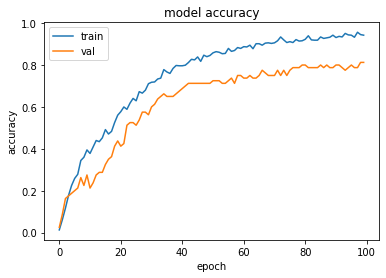

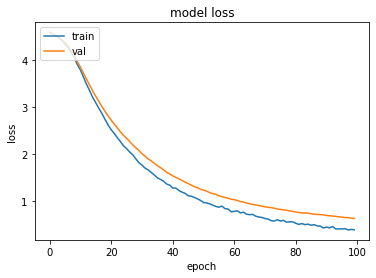

Epoch 1/100
24/24 [==============================] - 1s 15ms/step - loss: 4.5868 - accuracy: 0.0183 - val_loss: 4.5706 - val_accuracy: 0.1250
Epoch 2/100
24/24 [==============================] - 0s 5ms/step - loss: 4.5524 - accuracy: 0.0787 - val_loss: 4.5474 - val_accuracy: 0.1125
Epoch 3/100
24/24 [==============================] - 0s 6ms/step - loss: 4.5225 - accuracy: 0.1250 - val_loss: 4.5176 - val_accuracy: 0.1625
Epoch 4/100
24/24 [==============================] - 0s 6ms/step - loss: 4.4749 - accuracy: 0.2008 - val_loss: 4.4810 - val_accuracy: 0.2000
Epoch 5/100
24/24 [==============================] - 0s 6ms/step - loss: 4.4344 - accuracy: 0.2163 - val_loss: 4.4365 - val_accuracy: 0.2125
Epoch 6/100
24/24 [==============================] - 0s 6ms/step - loss: 4.3718 - accuracy: 0.2360 - val_loss: 4.3798 - val_accuracy: 0.2500
Epoch 7/100
24/24 [==============================] - 0s 6ms/step - loss: 4.2983 - accuracy: 0.2809 - val_loss: 4.3144 - val_accuracy: 0.2500
Epoch 8/100


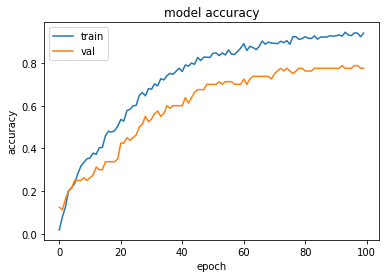

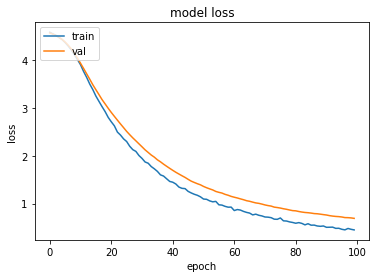

Epoch 1/100
36/36 [==============================] - 1s 9ms/step - loss: 4.5895 - accuracy: 0.0183 - val_loss: 4.5662 - val_accuracy: 0.0500
Epoch 2/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5531 - accuracy: 0.0548 - val_loss: 4.5418 - val_accuracy: 0.1500
Epoch 3/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5177 - accuracy: 0.1180 - val_loss: 4.5139 - val_accuracy: 0.1625
Epoch 4/100
36/36 [==============================] - 0s 5ms/step - loss: 4.4786 - accuracy: 0.1770 - val_loss: 4.4830 - val_accuracy: 0.1500
Epoch 5/100
36/36 [==============================] - 0s 5ms/step - loss: 4.4275 - accuracy: 0.2219 - val_loss: 4.4425 - val_accuracy: 0.1500
Epoch 6/100
36/36 [==============================] - 0s 4ms/step - loss: 4.3807 - accuracy: 0.2472 - val_loss: 4.3956 - val_accuracy: 0.2000
Epoch 7/100
36/36 [==============================] - 0s 4ms/step - loss: 4.3159 - accuracy: 0.2598 - val_loss: 4.3413 - val_accuracy: 0.1750
Epoch 8/100
3

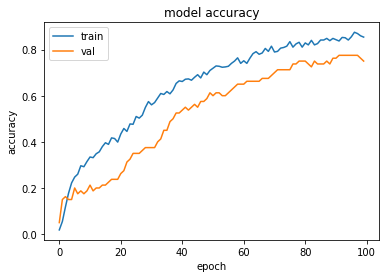

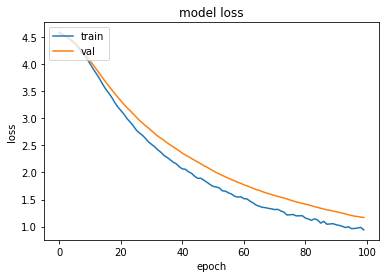

Epoch 1/100
29/29 [==============================] - 1s 16ms/step - loss: 4.5856 - accuracy: 0.0211 - val_loss: 4.5745 - val_accuracy: 0.0250
Epoch 2/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5544 - accuracy: 0.0492 - val_loss: 4.5503 - val_accuracy: 0.0875
Epoch 3/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5213 - accuracy: 0.1067 - val_loss: 4.5237 - val_accuracy: 0.1625
Epoch 4/100
29/29 [==============================] - 0s 6ms/step - loss: 4.4933 - accuracy: 0.1685 - val_loss: 4.4937 - val_accuracy: 0.1750
Epoch 5/100
29/29 [==============================] - 0s 5ms/step - loss: 4.4460 - accuracy: 0.2093 - val_loss: 4.4610 - val_accuracy: 0.1875
Epoch 6/100
29/29 [==============================] - 0s 8ms/step - loss: 4.3991 - accuracy: 0.2374 - val_loss: 4.4210 - val_accuracy: 0.1750
Epoch 7/100
29/29 [==============================] - 0s 8ms/step - loss: 4.3447 - accuracy: 0.2640 - val_loss: 4.3755 - val_accuracy: 0.1500
Epoch 8/100


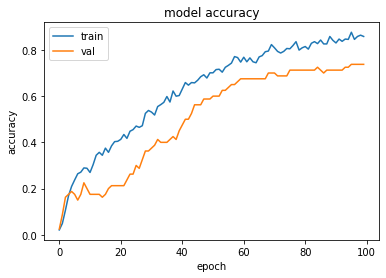

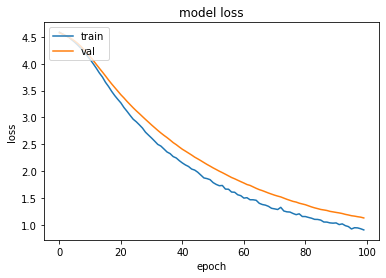

Epoch 1/100
24/24 [==============================] - 1s 13ms/step - loss: 4.5858 - accuracy: 0.0140 - val_loss: 4.5786 - val_accuracy: 0.0375
Epoch 2/100
24/24 [==============================] - 0s 5ms/step - loss: 4.5609 - accuracy: 0.0393 - val_loss: 4.5598 - val_accuracy: 0.0875
Epoch 3/100
24/24 [==============================] - 0s 5ms/step - loss: 4.5295 - accuracy: 0.0829 - val_loss: 4.5369 - val_accuracy: 0.1000
Epoch 4/100
24/24 [==============================] - 0s 5ms/step - loss: 4.5024 - accuracy: 0.1320 - val_loss: 4.5126 - val_accuracy: 0.1375
Epoch 5/100
24/24 [==============================] - 0s 6ms/step - loss: 4.4698 - accuracy: 0.1784 - val_loss: 4.4844 - val_accuracy: 0.1500
Epoch 6/100
24/24 [==============================] - 0s 5ms/step - loss: 4.4331 - accuracy: 0.2065 - val_loss: 4.4517 - val_accuracy: 0.1500
Epoch 7/100
24/24 [==============================] - 0s 5ms/step - loss: 4.3897 - accuracy: 0.2514 - val_loss: 4.4154 - val_accuracy: 0.1500
Epoch 8/100


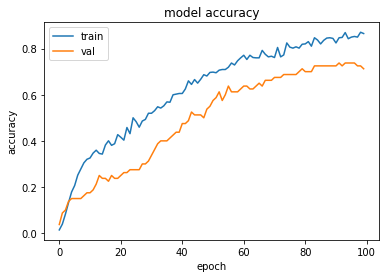

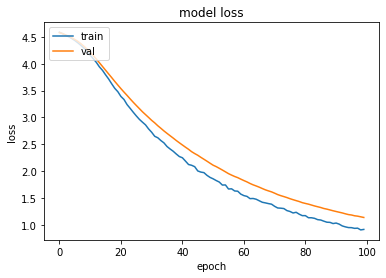

Epoch 1/100
36/36 [==============================] - 1s 9ms/step - loss: 4.5978 - accuracy: 0.0056 - val_loss: 4.6014 - val_accuracy: 0.0000e+00
Epoch 2/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5966 - accuracy: 0.0042 - val_loss: 4.6016 - val_accuracy: 0.0000e+00
Epoch 3/100
36/36 [==============================] - 0s 4ms/step - loss: 4.5949 - accuracy: 0.0042 - val_loss: 4.6018 - val_accuracy: 0.0000e+00
Epoch 4/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5948 - accuracy: 0.0140 - val_loss: 4.6020 - val_accuracy: 0.0000e+00
Epoch 5/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5928 - accuracy: 0.0126 - val_loss: 4.6021 - val_accuracy: 0.0000e+00
Epoch 6/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5926 - accuracy: 0.0084 - val_loss: 4.6022 - val_accuracy: 0.0000e+00
Epoch 7/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5921 - accuracy: 0.0126 - val_loss: 4.6026 - val_accura

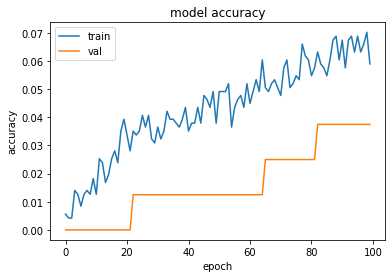

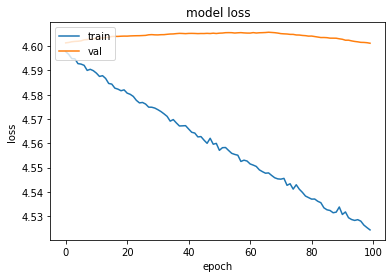

Epoch 1/100
29/29 [==============================] - 1s 15ms/step - loss: 4.5945 - accuracy: 0.0211 - val_loss: 4.5944 - val_accuracy: 0.0125
Epoch 2/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5940 - accuracy: 0.0197 - val_loss: 4.5947 - val_accuracy: 0.0125
Epoch 3/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5936 - accuracy: 0.0239 - val_loss: 4.5949 - val_accuracy: 0.0125
Epoch 4/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5922 - accuracy: 0.0225 - val_loss: 4.5952 - val_accuracy: 0.0125
Epoch 5/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5920 - accuracy: 0.0239 - val_loss: 4.5954 - val_accuracy: 0.0125
Epoch 6/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5903 - accuracy: 0.0197 - val_loss: 4.5956 - val_accuracy: 0.0125
Epoch 7/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5915 - accuracy: 0.0281 - val_loss: 4.5957 - val_accuracy: 0.0125
Epoch 8/100


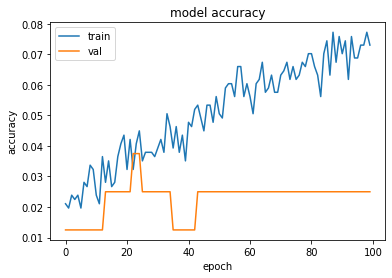

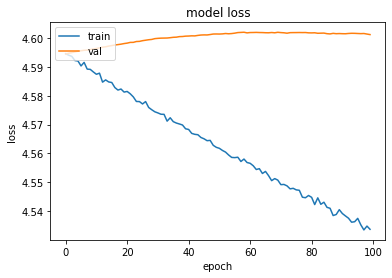

Epoch 1/100
24/24 [==============================] - 1s 18ms/step - loss: 4.5996 - accuracy: 0.0056 - val_loss: 4.6003 - val_accuracy: 0.0000e+00
Epoch 2/100
24/24 [==============================] - 0s 9ms/step - loss: 4.5986 - accuracy: 0.0070 - val_loss: 4.6004 - val_accuracy: 0.0000e+00
Epoch 3/100
24/24 [==============================] - 0s 8ms/step - loss: 4.5996 - accuracy: 0.0140 - val_loss: 4.6005 - val_accuracy: 0.0000e+00
Epoch 4/100
24/24 [==============================] - 0s 11ms/step - loss: 4.5980 - accuracy: 0.0070 - val_loss: 4.6005 - val_accuracy: 0.0000e+00
Epoch 5/100
24/24 [==============================] - 0s 9ms/step - loss: 4.5966 - accuracy: 0.0084 - val_loss: 4.6007 - val_accuracy: 0.0000e+00
Epoch 6/100
24/24 [==============================] - 0s 9ms/step - loss: 4.5962 - accuracy: 0.0084 - val_loss: 4.6008 - val_accuracy: 0.0000e+00
Epoch 7/100
24/24 [==============================] - 0s 9ms/step - loss: 4.5959 - accuracy: 0.0112 - val_loss: 4.6010 - val_accu

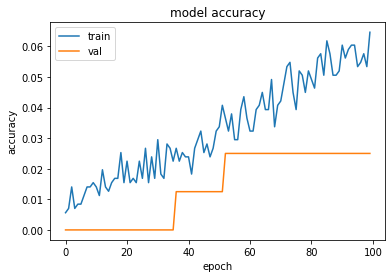

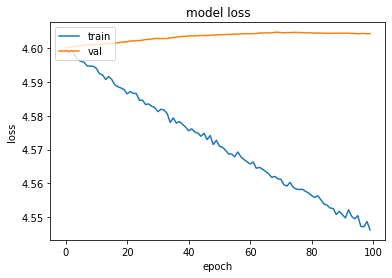

Epoch 1/100
36/36 [==============================] - 1s 13ms/step - loss: 4.5702 - accuracy: 0.0660 - val_loss: 4.5261 - val_accuracy: 0.1875
Epoch 2/100
36/36 [==============================] - 0s 5ms/step - loss: 4.4705 - accuracy: 0.3034 - val_loss: 4.4448 - val_accuracy: 0.2125
Epoch 3/100
36/36 [==============================] - 0s 5ms/step - loss: 4.3403 - accuracy: 0.3820 - val_loss: 4.3107 - val_accuracy: 0.2500
Epoch 4/100
36/36 [==============================] - 0s 5ms/step - loss: 4.1537 - accuracy: 0.4087 - val_loss: 4.1158 - val_accuracy: 0.2250
Epoch 5/100
36/36 [==============================] - 0s 5ms/step - loss: 3.8925 - accuracy: 0.4466 - val_loss: 3.8704 - val_accuracy: 0.2375
Epoch 6/100
36/36 [==============================] - 0s 5ms/step - loss: 3.5919 - accuracy: 0.4438 - val_loss: 3.6072 - val_accuracy: 0.2250
Epoch 7/100
36/36 [==============================] - 0s 5ms/step - loss: 3.2723 - accuracy: 0.5070 - val_loss: 3.3271 - val_accuracy: 0.2625
Epoch 8/100


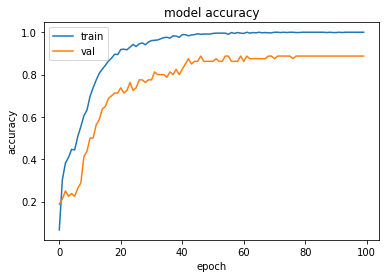

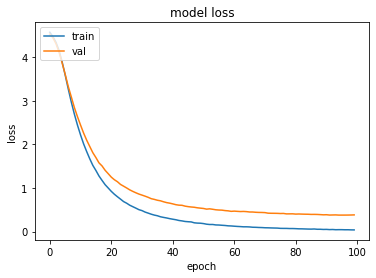

Epoch 1/100
29/29 [==============================] - 1s 12ms/step - loss: 4.5737 - accuracy: 0.0463 - val_loss: 4.5454 - val_accuracy: 0.0875
Epoch 2/100
29/29 [==============================] - 0s 6ms/step - loss: 4.4886 - accuracy: 0.2331 - val_loss: 4.4712 - val_accuracy: 0.1625
Epoch 3/100
29/29 [==============================] - 0s 5ms/step - loss: 4.3889 - accuracy: 0.3497 - val_loss: 4.3720 - val_accuracy: 0.2250
Epoch 4/100
29/29 [==============================] - 0s 6ms/step - loss: 4.2433 - accuracy: 0.4354 - val_loss: 4.2310 - val_accuracy: 0.2000
Epoch 5/100
29/29 [==============================] - 0s 6ms/step - loss: 4.0536 - accuracy: 0.4593 - val_loss: 4.0419 - val_accuracy: 0.2375
Epoch 6/100
29/29 [==============================] - 0s 6ms/step - loss: 3.8137 - accuracy: 0.4831 - val_loss: 3.8138 - val_accuracy: 0.2250
Epoch 7/100
29/29 [==============================] - 0s 6ms/step - loss: 3.5452 - accuracy: 0.4902 - val_loss: 3.5636 - val_accuracy: 0.2500
Epoch 8/100


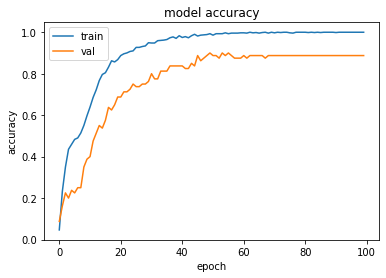

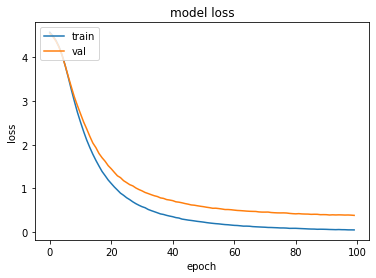

Epoch 1/100
24/24 [==============================] - 1s 17ms/step - loss: 4.5751 - accuracy: 0.0421 - val_loss: 4.5467 - val_accuracy: 0.1250
Epoch 2/100
24/24 [==============================] - 0s 8ms/step - loss: 4.5001 - accuracy: 0.2809 - val_loss: 4.4813 - val_accuracy: 0.2250
Epoch 3/100
24/24 [==============================] - 0s 8ms/step - loss: 4.4143 - accuracy: 0.4199 - val_loss: 4.4024 - val_accuracy: 0.2500
Epoch 4/100
24/24 [==============================] - 0s 9ms/step - loss: 4.2960 - accuracy: 0.4579 - val_loss: 4.2826 - val_accuracy: 0.2250
Epoch 5/100
24/24 [==============================] - 0s 8ms/step - loss: 4.1412 - accuracy: 0.4537 - val_loss: 4.1311 - val_accuracy: 0.2750
Epoch 6/100
24/24 [==============================] - 0s 8ms/step - loss: 3.9448 - accuracy: 0.4958 - val_loss: 3.9406 - val_accuracy: 0.3000
Epoch 7/100
24/24 [==============================] - 0s 8ms/step - loss: 3.7153 - accuracy: 0.5140 - val_loss: 3.7361 - val_accuracy: 0.3250
Epoch 8/100


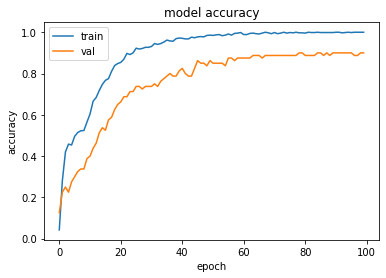

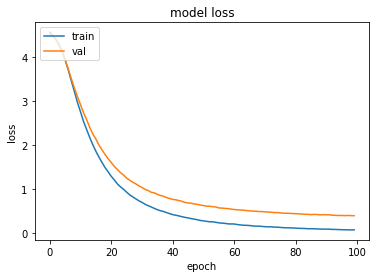

Epoch 1/100
36/36 [==============================] - 1s 15ms/step - loss: 4.5721 - accuracy: 0.0463 - val_loss: 4.5409 - val_accuracy: 0.1375
Epoch 2/100
36/36 [==============================] - 0s 6ms/step - loss: 4.4923 - accuracy: 0.2037 - val_loss: 4.4779 - val_accuracy: 0.1750
Epoch 3/100
36/36 [==============================] - 0s 6ms/step - loss: 4.3997 - accuracy: 0.3174 - val_loss: 4.3928 - val_accuracy: 0.1750
Epoch 4/100
36/36 [==============================] - 0s 5ms/step - loss: 4.2794 - accuracy: 0.3469 - val_loss: 4.2835 - val_accuracy: 0.1500
Epoch 5/100
36/36 [==============================] - 0s 6ms/step - loss: 4.1327 - accuracy: 0.3708 - val_loss: 4.1505 - val_accuracy: 0.1750
Epoch 6/100
36/36 [==============================] - 0s 7ms/step - loss: 3.9600 - accuracy: 0.3961 - val_loss: 4.0025 - val_accuracy: 0.1875
Epoch 7/100
36/36 [==============================] - 0s 6ms/step - loss: 3.7762 - accuracy: 0.3933 - val_loss: 3.8423 - val_accuracy: 0.1875
Epoch 8/100


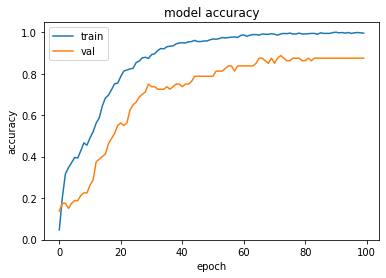

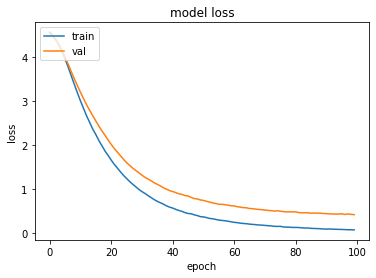

Epoch 1/100
29/29 [==============================] - 1s 15ms/step - loss: 4.5757 - accuracy: 0.0646 - val_loss: 4.5419 - val_accuracy: 0.1125
Epoch 2/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5056 - accuracy: 0.2219 - val_loss: 4.4877 - val_accuracy: 0.1500
Epoch 3/100
29/29 [==============================] - 0s 6ms/step - loss: 4.4302 - accuracy: 0.2851 - val_loss: 4.4193 - val_accuracy: 0.1750
Epoch 4/100
29/29 [==============================] - 0s 6ms/step - loss: 4.3356 - accuracy: 0.3610 - val_loss: 4.3315 - val_accuracy: 0.1375
Epoch 5/100
29/29 [==============================] - 0s 6ms/step - loss: 4.2193 - accuracy: 0.3722 - val_loss: 4.2284 - val_accuracy: 0.1625
Epoch 6/100
29/29 [==============================] - 0s 6ms/step - loss: 4.0840 - accuracy: 0.3862 - val_loss: 4.1038 - val_accuracy: 0.1625
Epoch 7/100
29/29 [==============================] - 0s 6ms/step - loss: 3.9279 - accuracy: 0.4256 - val_loss: 3.9685 - val_accuracy: 0.1625
Epoch 8/100


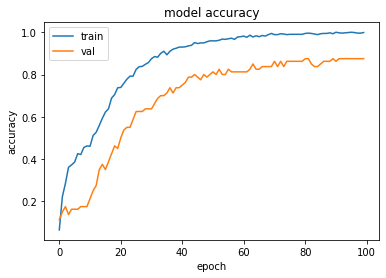

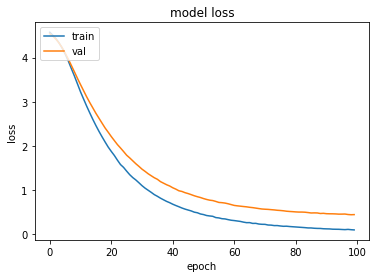

Epoch 1/100
24/24 [==============================] - 1s 18ms/step - loss: 4.5782 - accuracy: 0.0379 - val_loss: 4.5565 - val_accuracy: 0.0750
Epoch 2/100
24/24 [==============================] - 0s 7ms/step - loss: 4.5168 - accuracy: 0.1756 - val_loss: 4.5131 - val_accuracy: 0.1250
Epoch 3/100
24/24 [==============================] - 0s 7ms/step - loss: 4.4536 - accuracy: 0.2556 - val_loss: 4.4596 - val_accuracy: 0.1625
Epoch 4/100
24/24 [==============================] - 0s 7ms/step - loss: 4.3754 - accuracy: 0.3104 - val_loss: 4.3918 - val_accuracy: 0.1625
Epoch 5/100
24/24 [==============================] - 0s 8ms/step - loss: 4.2827 - accuracy: 0.3567 - val_loss: 4.3084 - val_accuracy: 0.1625
Epoch 6/100
24/24 [==============================] - 0s 7ms/step - loss: 4.1679 - accuracy: 0.3820 - val_loss: 4.2083 - val_accuracy: 0.1750
Epoch 7/100
24/24 [==============================] - 0s 7ms/step - loss: 4.0351 - accuracy: 0.4129 - val_loss: 4.0915 - val_accuracy: 0.1875
Epoch 8/100


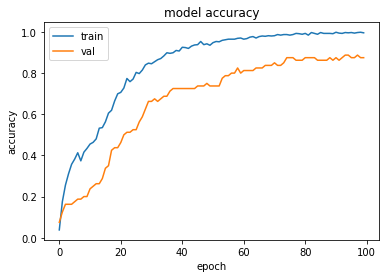

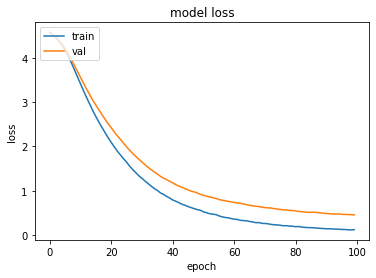

Epoch 1/100
36/36 [==============================] - 1s 13ms/step - loss: 4.5969 - accuracy: 0.0084 - val_loss: 4.6021 - val_accuracy: 0.0125
Epoch 2/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5968 - accuracy: 0.0140 - val_loss: 4.6025 - val_accuracy: 0.0125
Epoch 3/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5964 - accuracy: 0.0070 - val_loss: 4.6026 - val_accuracy: 0.0125
Epoch 4/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5954 - accuracy: 0.0028 - val_loss: 4.6026 - val_accuracy: 0.0125
Epoch 5/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5920 - accuracy: 0.0112 - val_loss: 4.6028 - val_accuracy: 0.0125
Epoch 6/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5951 - accuracy: 0.0098 - val_loss: 4.6031 - val_accuracy: 0.0125
Epoch 7/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5928 - accuracy: 0.0211 - val_loss: 4.6034 - val_accuracy: 0.0125
Epoch 8/100


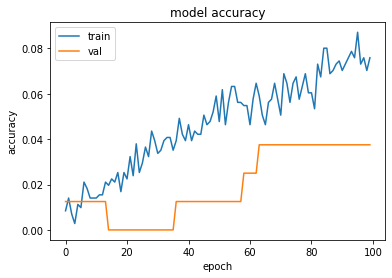

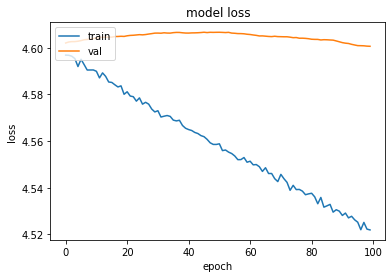

Epoch 1/100
29/29 [==============================] - 1s 18ms/step - loss: 4.5960 - accuracy: 0.0154 - val_loss: 4.5896 - val_accuracy: 0.0125
Epoch 2/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5955 - accuracy: 0.0126 - val_loss: 4.5896 - val_accuracy: 0.0125
Epoch 3/100
29/29 [==============================] - 0s 8ms/step - loss: 4.5967 - accuracy: 0.0140 - val_loss: 4.5897 - val_accuracy: 0.0125
Epoch 4/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5947 - accuracy: 0.0126 - val_loss: 4.5897 - val_accuracy: 0.0125
Epoch 5/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5954 - accuracy: 0.0098 - val_loss: 4.5898 - val_accuracy: 0.0125
Epoch 6/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5922 - accuracy: 0.0183 - val_loss: 4.5899 - val_accuracy: 0.0125
Epoch 7/100
29/29 [==============================] - 0s 8ms/step - loss: 4.5930 - accuracy: 0.0169 - val_loss: 4.5900 - val_accuracy: 0.0125
Epoch 8/100


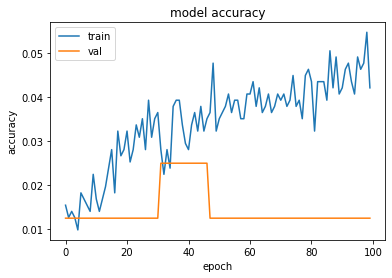

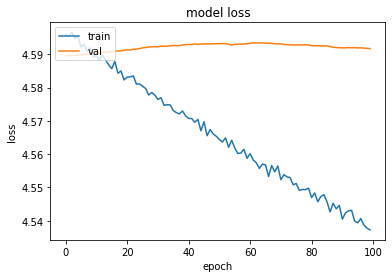

Epoch 1/100
24/24 [==============================] - 1s 18ms/step - loss: 4.5917 - accuracy: 0.0070 - val_loss: 4.5962 - val_accuracy: 0.0000e+00
Epoch 2/100
24/24 [==============================] - 0s 7ms/step - loss: 4.5926 - accuracy: 0.0070 - val_loss: 4.5964 - val_accuracy: 0.0000e+00
Epoch 3/100
24/24 [==============================] - 0s 6ms/step - loss: 4.5917 - accuracy: 0.0112 - val_loss: 4.5966 - val_accuracy: 0.0000e+00
Epoch 4/100
24/24 [==============================] - 0s 6ms/step - loss: 4.5920 - accuracy: 0.0084 - val_loss: 4.5967 - val_accuracy: 0.0000e+00
Epoch 5/100
24/24 [==============================] - 0s 6ms/step - loss: 4.5900 - accuracy: 0.0126 - val_loss: 4.5968 - val_accuracy: 0.0000e+00
Epoch 6/100
24/24 [==============================] - 0s 8ms/step - loss: 4.5894 - accuracy: 0.0112 - val_loss: 4.5971 - val_accuracy: 0.0000e+00
Epoch 7/100
24/24 [==============================] - 0s 7ms/step - loss: 4.5894 - accuracy: 0.0169 - val_loss: 4.5972 - val_accur

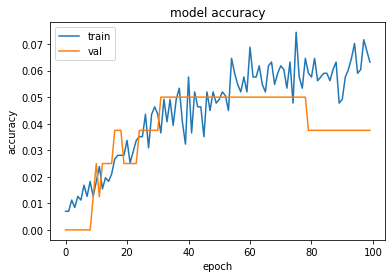

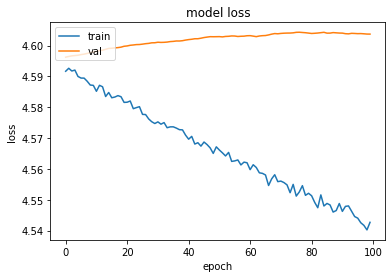

Epoch 1/100
36/36 [==============================] - 1s 12ms/step - loss: 4.5704 - accuracy: 0.0576 - val_loss: 4.5376 - val_accuracy: 0.1250
Epoch 2/100
36/36 [==============================] - 0s 5ms/step - loss: 4.4863 - accuracy: 0.2163 - val_loss: 4.4639 - val_accuracy: 0.1875
Epoch 3/100
36/36 [==============================] - 0s 5ms/step - loss: 4.3784 - accuracy: 0.3104 - val_loss: 4.3649 - val_accuracy: 0.1750
Epoch 4/100
36/36 [==============================] - 0s 5ms/step - loss: 4.2272 - accuracy: 0.4017 - val_loss: 4.2149 - val_accuracy: 0.2625
Epoch 5/100
36/36 [==============================] - 0s 6ms/step - loss: 4.0261 - accuracy: 0.3820 - val_loss: 4.0154 - val_accuracy: 0.2125
Epoch 6/100
36/36 [==============================] - 0s 6ms/step - loss: 3.7798 - accuracy: 0.4537 - val_loss: 3.7895 - val_accuracy: 0.2500
Epoch 7/100
36/36 [==============================] - 0s 6ms/step - loss: 3.4958 - accuracy: 0.5070 - val_loss: 3.5398 - val_accuracy: 0.2625
Epoch 8/100


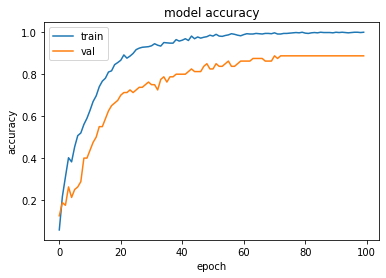

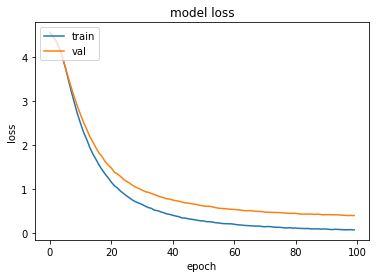

Epoch 1/100
29/29 [==============================] - 1s 18ms/step - loss: 4.5774 - accuracy: 0.0463 - val_loss: 4.5411 - val_accuracy: 0.1250
Epoch 2/100
29/29 [==============================] - 0s 8ms/step - loss: 4.5004 - accuracy: 0.2022 - val_loss: 4.4801 - val_accuracy: 0.2125
Epoch 3/100
29/29 [==============================] - 0s 8ms/step - loss: 4.4101 - accuracy: 0.3455 - val_loss: 4.3927 - val_accuracy: 0.2500
Epoch 4/100
29/29 [==============================] - 0s 8ms/step - loss: 4.2899 - accuracy: 0.4003 - val_loss: 4.2831 - val_accuracy: 0.2250
Epoch 5/100
29/29 [==============================] - 0s 7ms/step - loss: 4.1322 - accuracy: 0.4087 - val_loss: 4.1328 - val_accuracy: 0.1750
Epoch 6/100
29/29 [==============================] - 0s 8ms/step - loss: 3.9266 - accuracy: 0.4340 - val_loss: 3.9424 - val_accuracy: 0.2625
Epoch 7/100
29/29 [==============================] - 0s 9ms/step - loss: 3.6952 - accuracy: 0.4579 - val_loss: 3.7418 - val_accuracy: 0.2000
Epoch 8/100


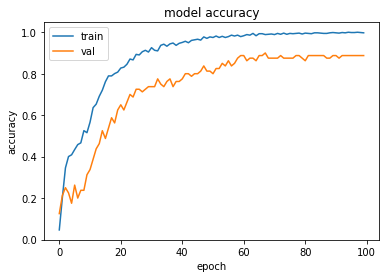

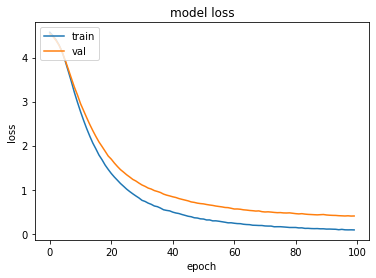

Epoch 1/100
24/24 [==============================] - 2s 21ms/step - loss: 4.5768 - accuracy: 0.0435 - val_loss: 4.5591 - val_accuracy: 0.1125
Epoch 2/100
24/24 [==============================] - 0s 8ms/step - loss: 4.5103 - accuracy: 0.1840 - val_loss: 4.5078 - val_accuracy: 0.1500
Epoch 3/100
24/24 [==============================] - 0s 7ms/step - loss: 4.4367 - accuracy: 0.3118 - val_loss: 4.4413 - val_accuracy: 0.1750
Epoch 4/100
24/24 [==============================] - 0s 7ms/step - loss: 4.3374 - accuracy: 0.3736 - val_loss: 4.3439 - val_accuracy: 0.2250
Epoch 5/100
24/24 [==============================] - 0s 7ms/step - loss: 4.2111 - accuracy: 0.4228 - val_loss: 4.2266 - val_accuracy: 0.2250
Epoch 6/100
24/24 [==============================] - 0s 8ms/step - loss: 4.0534 - accuracy: 0.4480 - val_loss: 4.0765 - val_accuracy: 0.2250
Epoch 7/100
24/24 [==============================] - 0s 8ms/step - loss: 3.8580 - accuracy: 0.4326 - val_loss: 3.9005 - val_accuracy: 0.2250
Epoch 8/100


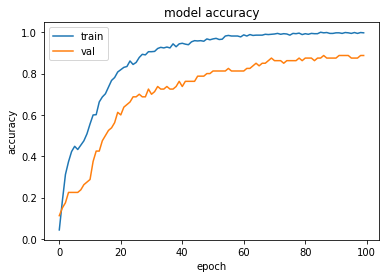

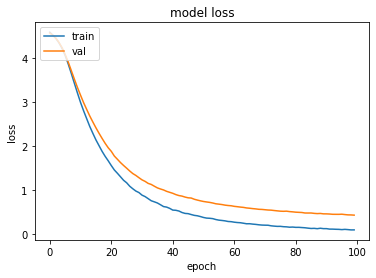

Epoch 1/100
36/36 [==============================] - 1s 13ms/step - loss: 4.5741 - accuracy: 0.0365 - val_loss: 4.5450 - val_accuracy: 0.1375
Epoch 2/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5050 - accuracy: 0.1685 - val_loss: 4.4900 - val_accuracy: 0.1500
Epoch 3/100
36/36 [==============================] - 0s 5ms/step - loss: 4.4261 - accuracy: 0.2837 - val_loss: 4.4181 - val_accuracy: 0.2000
Epoch 4/100
36/36 [==============================] - 0s 5ms/step - loss: 4.3272 - accuracy: 0.3244 - val_loss: 4.3295 - val_accuracy: 0.2250
Epoch 5/100
36/36 [==============================] - 0s 5ms/step - loss: 4.2081 - accuracy: 0.3890 - val_loss: 4.2189 - val_accuracy: 0.2125
Epoch 6/100
36/36 [==============================] - 0s 5ms/step - loss: 4.0671 - accuracy: 0.4073 - val_loss: 4.0900 - val_accuracy: 0.2000
Epoch 7/100
36/36 [==============================] - 0s 6ms/step - loss: 3.9133 - accuracy: 0.4199 - val_loss: 3.9493 - val_accuracy: 0.1875
Epoch 8/100


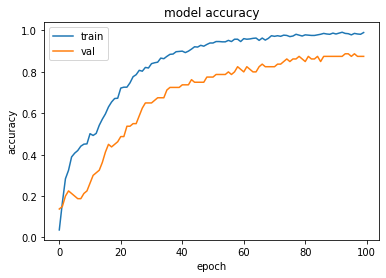

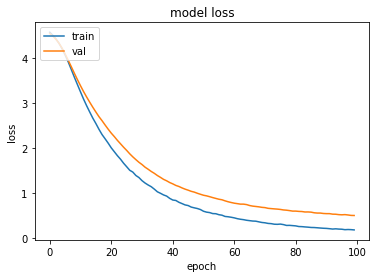

Epoch 1/100
29/29 [==============================] - 1s 13ms/step - loss: 4.5756 - accuracy: 0.0407 - val_loss: 4.5624 - val_accuracy: 0.1000
Epoch 2/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5176 - accuracy: 0.1601 - val_loss: 4.5174 - val_accuracy: 0.1750
Epoch 3/100
29/29 [==============================] - 0s 6ms/step - loss: 4.4509 - accuracy: 0.2669 - val_loss: 4.4616 - val_accuracy: 0.1875
Epoch 4/100
29/29 [==============================] - 0s 6ms/step - loss: 4.3758 - accuracy: 0.2978 - val_loss: 4.3917 - val_accuracy: 0.1875
Epoch 5/100
29/29 [==============================] - 0s 6ms/step - loss: 4.2809 - accuracy: 0.3567 - val_loss: 4.3075 - val_accuracy: 0.2125
Epoch 6/100
29/29 [==============================] - 0s 6ms/step - loss: 4.1649 - accuracy: 0.3694 - val_loss: 4.2071 - val_accuracy: 0.2000
Epoch 7/100
29/29 [==============================] - 0s 6ms/step - loss: 4.0396 - accuracy: 0.3848 - val_loss: 4.0937 - val_accuracy: 0.1875
Epoch 8/100


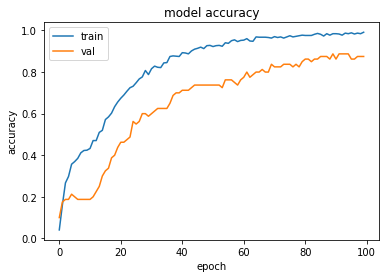

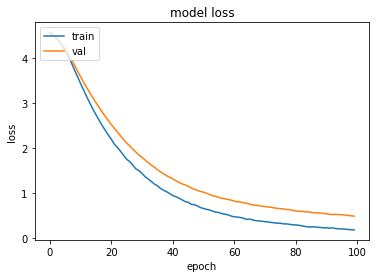

Epoch 1/100
24/24 [==============================] - 1s 18ms/step - loss: 4.5808 - accuracy: 0.0309 - val_loss: 4.5563 - val_accuracy: 0.1625
Epoch 2/100
24/24 [==============================] - 0s 7ms/step - loss: 4.5236 - accuracy: 0.1362 - val_loss: 4.5171 - val_accuracy: 0.2250
Epoch 3/100
24/24 [==============================] - 0s 7ms/step - loss: 4.4692 - accuracy: 0.2584 - val_loss: 4.4699 - val_accuracy: 0.2000
Epoch 4/100
24/24 [==============================] - 0s 6ms/step - loss: 4.4016 - accuracy: 0.3287 - val_loss: 4.4114 - val_accuracy: 0.2125
Epoch 5/100
24/24 [==============================] - 0s 7ms/step - loss: 4.3223 - accuracy: 0.3652 - val_loss: 4.3407 - val_accuracy: 0.2375
Epoch 6/100
24/24 [==============================] - 0s 7ms/step - loss: 4.2305 - accuracy: 0.3764 - val_loss: 4.2550 - val_accuracy: 0.2250
Epoch 7/100
24/24 [==============================] - 0s 7ms/step - loss: 4.1171 - accuracy: 0.4354 - val_loss: 4.1598 - val_accuracy: 0.2125
Epoch 8/100


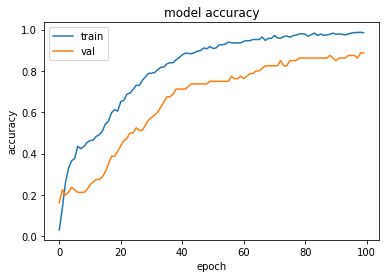

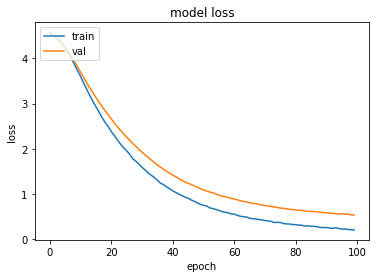

Epoch 1/100
36/36 [==============================] - 1s 15ms/step - loss: 4.5986 - accuracy: 0.0084 - val_loss: 4.5909 - val_accuracy: 0.0000e+00
Epoch 2/100
36/36 [==============================] - 0s 5ms/step - loss: 4.6009 - accuracy: 0.0098 - val_loss: 4.5911 - val_accuracy: 0.0125
Epoch 3/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5946 - accuracy: 0.0140 - val_loss: 4.5916 - val_accuracy: 0.0125
Epoch 4/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5953 - accuracy: 0.0140 - val_loss: 4.5918 - val_accuracy: 0.0125
Epoch 5/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5951 - accuracy: 0.0056 - val_loss: 4.5920 - val_accuracy: 0.0125
Epoch 6/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5939 - accuracy: 0.0154 - val_loss: 4.5923 - val_accuracy: 0.0125
Epoch 7/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5923 - accuracy: 0.0140 - val_loss: 4.5927 - val_accuracy: 0.0125
Epoch 8/

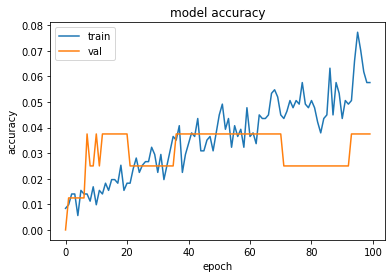

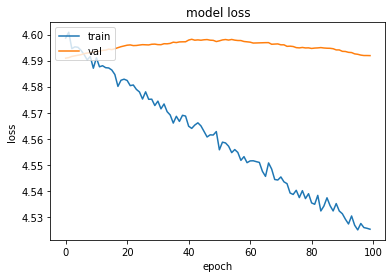

Epoch 1/100
29/29 [==============================] - 1s 16ms/step - loss: 4.5949 - accuracy: 0.0154 - val_loss: 4.6001 - val_accuracy: 0.0125
Epoch 2/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5980 - accuracy: 0.0042 - val_loss: 4.6001 - val_accuracy: 0.0125
Epoch 3/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5953 - accuracy: 0.0028 - val_loss: 4.5999 - val_accuracy: 0.0125
Epoch 4/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5940 - accuracy: 0.0098 - val_loss: 4.5999 - val_accuracy: 0.0125
Epoch 5/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5958 - accuracy: 0.0098 - val_loss: 4.6001 - val_accuracy: 0.0125
Epoch 6/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5953 - accuracy: 0.0014 - val_loss: 4.6002 - val_accuracy: 0.0125
Epoch 7/100
29/29 [==============================] - 0s 5ms/step - loss: 4.5911 - accuracy: 0.0070 - val_loss: 4.6005 - val_accuracy: 0.0125
Epoch 8/100


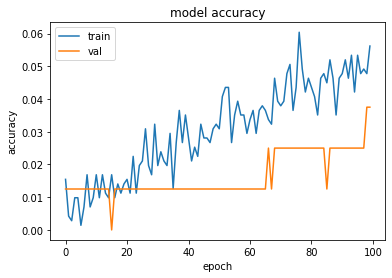

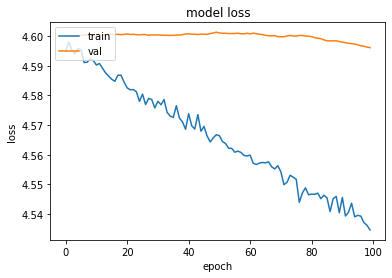

Epoch 1/100
24/24 [==============================] - 1s 18ms/step - loss: 4.5954 - accuracy: 0.0070 - val_loss: 4.5991 - val_accuracy: 0.0000e+00
Epoch 2/100
24/24 [==============================] - 0s 7ms/step - loss: 4.5957 - accuracy: 0.0126 - val_loss: 4.5991 - val_accuracy: 0.0000e+00
Epoch 3/100
24/24 [==============================] - 0s 7ms/step - loss: 4.5969 - accuracy: 0.0042 - val_loss: 4.5992 - val_accuracy: 0.0000e+00
Epoch 4/100
24/24 [==============================] - 0s 8ms/step - loss: 4.5939 - accuracy: 0.0056 - val_loss: 4.5992 - val_accuracy: 0.0000e+00
Epoch 5/100
24/24 [==============================] - 0s 6ms/step - loss: 4.5963 - accuracy: 0.0112 - val_loss: 4.5992 - val_accuracy: 0.0000e+00
Epoch 6/100
24/24 [==============================] - 0s 6ms/step - loss: 4.5914 - accuracy: 0.0042 - val_loss: 4.5995 - val_accuracy: 0.0000e+00
Epoch 7/100
24/24 [==============================] - 0s 7ms/step - loss: 4.5926 - accuracy: 0.0112 - val_loss: 4.5996 - val_accur

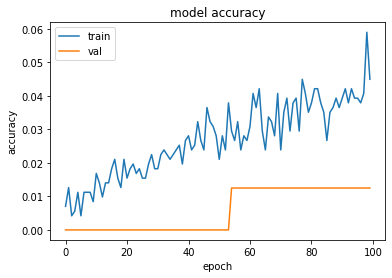

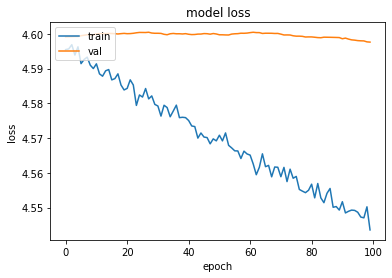

Epoch 1/100
36/36 [==============================] - 1s 13ms/step - loss: 4.5805 - accuracy: 0.0295 - val_loss: 4.5662 - val_accuracy: 0.0625
Epoch 2/100
36/36 [==============================] - 0s 5ms/step - loss: 4.5146 - accuracy: 0.1194 - val_loss: 4.5142 - val_accuracy: 0.1125
Epoch 3/100
36/36 [==============================] - 0s 5ms/step - loss: 4.4371 - accuracy: 0.1994 - val_loss: 4.4469 - val_accuracy: 0.1750
Epoch 4/100
36/36 [==============================] - 0s 5ms/step - loss: 4.3382 - accuracy: 0.2697 - val_loss: 4.3611 - val_accuracy: 0.2000
Epoch 5/100
36/36 [==============================] - 0s 5ms/step - loss: 4.2022 - accuracy: 0.3329 - val_loss: 4.2354 - val_accuracy: 0.1625
Epoch 6/100
36/36 [==============================] - 0s 5ms/step - loss: 4.0359 - accuracy: 0.3441 - val_loss: 4.0721 - val_accuracy: 0.1875
Epoch 7/100
36/36 [==============================] - 0s 5ms/step - loss: 3.8296 - accuracy: 0.3820 - val_loss: 3.8860 - val_accuracy: 0.2000
Epoch 8/100


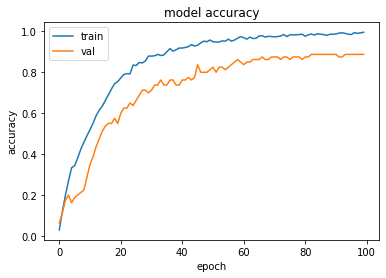

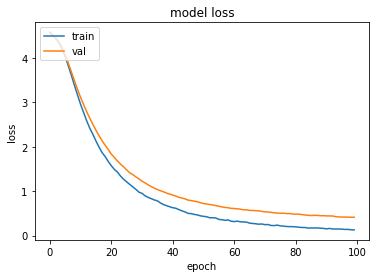

Epoch 1/100
29/29 [==============================] - 1s 15ms/step - loss: 4.5870 - accuracy: 0.0140 - val_loss: 4.5692 - val_accuracy: 0.0375
Epoch 2/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5229 - accuracy: 0.1222 - val_loss: 4.5263 - val_accuracy: 0.1000
Epoch 3/100
29/29 [==============================] - 0s 6ms/step - loss: 4.4576 - accuracy: 0.2079 - val_loss: 4.4714 - val_accuracy: 0.2125
Epoch 4/100
29/29 [==============================] - 0s 6ms/step - loss: 4.3813 - accuracy: 0.2725 - val_loss: 4.3947 - val_accuracy: 0.2250
Epoch 5/100
29/29 [==============================] - 0s 5ms/step - loss: 4.2715 - accuracy: 0.3272 - val_loss: 4.2991 - val_accuracy: 0.2500
Epoch 6/100
29/29 [==============================] - 0s 6ms/step - loss: 4.1505 - accuracy: 0.3441 - val_loss: 4.1777 - val_accuracy: 0.2500
Epoch 7/100
29/29 [==============================] - 0s 6ms/step - loss: 4.0022 - accuracy: 0.3919 - val_loss: 4.0338 - val_accuracy: 0.2500
Epoch 8/100


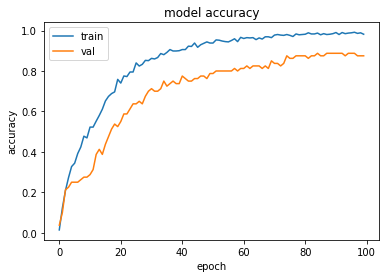

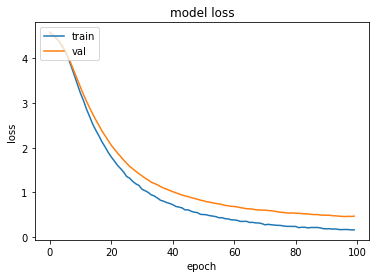

Epoch 1/100
24/24 [==============================] - 2s 22ms/step - loss: 4.5829 - accuracy: 0.0309 - val_loss: 4.5614 - val_accuracy: 0.1250
Epoch 2/100
24/24 [==============================] - 0s 7ms/step - loss: 4.5276 - accuracy: 0.1124 - val_loss: 4.5217 - val_accuracy: 0.1875
Epoch 3/100
24/24 [==============================] - 0s 9ms/step - loss: 4.4724 - accuracy: 0.1854 - val_loss: 4.4745 - val_accuracy: 0.1625
Epoch 4/100
24/24 [==============================] - 0s 11ms/step - loss: 4.4066 - accuracy: 0.2486 - val_loss: 4.4165 - val_accuracy: 0.2125
Epoch 5/100
24/24 [==============================] - 0s 10ms/step - loss: 4.3200 - accuracy: 0.3287 - val_loss: 4.3364 - val_accuracy: 0.2500
Epoch 6/100
24/24 [==============================] - 0s 10ms/step - loss: 4.2093 - accuracy: 0.3596 - val_loss: 4.2394 - val_accuracy: 0.2500
Epoch 7/100
24/24 [==============================] - 0s 11ms/step - loss: 4.0815 - accuracy: 0.3862 - val_loss: 4.1180 - val_accuracy: 0.2250
Epoch 8/

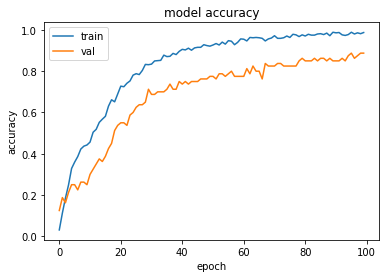

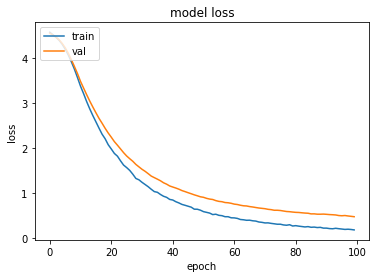

Epoch 1/100
36/36 [==============================] - 1s 18ms/step - loss: 4.5770 - accuracy: 0.0309 - val_loss: 4.5613 - val_accuracy: 0.0625
Epoch 2/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5218 - accuracy: 0.1222 - val_loss: 4.5199 - val_accuracy: 0.1125
Epoch 3/100
36/36 [==============================] - 0s 6ms/step - loss: 4.4637 - accuracy: 0.2008 - val_loss: 4.4674 - val_accuracy: 0.1375
Epoch 4/100
36/36 [==============================] - 0s 6ms/step - loss: 4.3964 - accuracy: 0.2767 - val_loss: 4.4081 - val_accuracy: 0.1625
Epoch 5/100
36/36 [==============================] - 0s 5ms/step - loss: 4.3133 - accuracy: 0.2949 - val_loss: 4.3365 - val_accuracy: 0.1875
Epoch 6/100
36/36 [==============================] - 0s 6ms/step - loss: 4.2091 - accuracy: 0.3202 - val_loss: 4.2523 - val_accuracy: 0.1625
Epoch 7/100
36/36 [==============================] - 0s 5ms/step - loss: 4.1108 - accuracy: 0.3174 - val_loss: 4.1545 - val_accuracy: 0.1750
Epoch 8/100


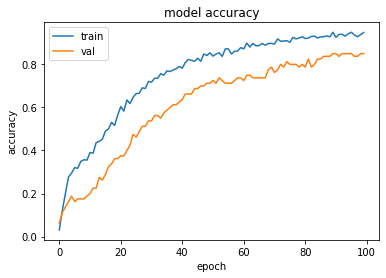

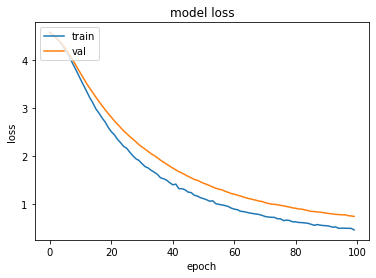

Epoch 1/100
29/29 [==============================] - 1s 16ms/step - loss: 4.5833 - accuracy: 0.0126 - val_loss: 4.5615 - val_accuracy: 0.0375
Epoch 2/100
29/29 [==============================] - 0s 8ms/step - loss: 4.5324 - accuracy: 0.0983 - val_loss: 4.5268 - val_accuracy: 0.0875
Epoch 3/100
29/29 [==============================] - 0s 7ms/step - loss: 4.4853 - accuracy: 0.1952 - val_loss: 4.4879 - val_accuracy: 0.0750
Epoch 4/100
29/29 [==============================] - 0s 7ms/step - loss: 4.4248 - accuracy: 0.2514 - val_loss: 4.4398 - val_accuracy: 0.0875
Epoch 5/100
29/29 [==============================] - 0s 7ms/step - loss: 4.3581 - accuracy: 0.2739 - val_loss: 4.3840 - val_accuracy: 0.1250
Epoch 6/100
29/29 [==============================] - 0s 6ms/step - loss: 4.2727 - accuracy: 0.3258 - val_loss: 4.3131 - val_accuracy: 0.1375
Epoch 7/100
29/29 [==============================] - 0s 8ms/step - loss: 4.1849 - accuracy: 0.3525 - val_loss: 4.2335 - val_accuracy: 0.1375
Epoch 8/100


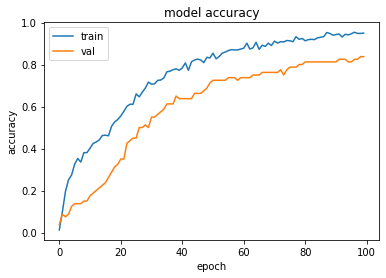

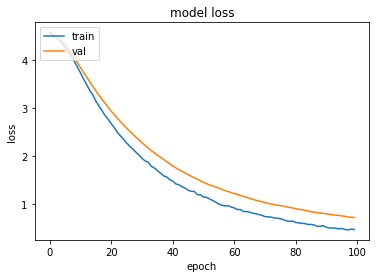

Epoch 1/100
24/24 [==============================] - 1s 27ms/step - loss: 4.5786 - accuracy: 0.0239 - val_loss: 4.5626 - val_accuracy: 0.1000
Epoch 2/100
24/24 [==============================] - 0s 8ms/step - loss: 4.5330 - accuracy: 0.1110 - val_loss: 4.5304 - val_accuracy: 0.1375
Epoch 3/100
24/24 [==============================] - 0s 7ms/step - loss: 4.4877 - accuracy: 0.1784 - val_loss: 4.4964 - val_accuracy: 0.1500
Epoch 4/100
24/24 [==============================] - 0s 7ms/step - loss: 4.4355 - accuracy: 0.2360 - val_loss: 4.4550 - val_accuracy: 0.1625
Epoch 5/100
24/24 [==============================] - 0s 7ms/step - loss: 4.3791 - accuracy: 0.2654 - val_loss: 4.4064 - val_accuracy: 0.1500
Epoch 6/100
24/24 [==============================] - 0s 7ms/step - loss: 4.3073 - accuracy: 0.3076 - val_loss: 4.3475 - val_accuracy: 0.1875
Epoch 7/100
24/24 [==============================] - 0s 6ms/step - loss: 4.2289 - accuracy: 0.3216 - val_loss: 4.2807 - val_accuracy: 0.1750
Epoch 8/100


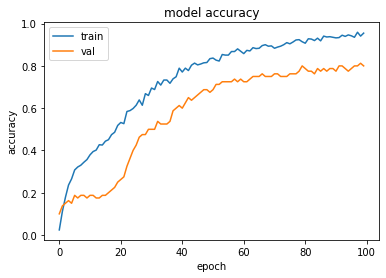

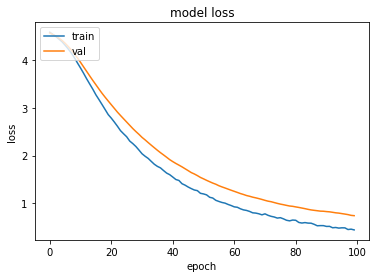

Epoch 1/100
36/36 [==============================] - 1s 14ms/step - loss: 4.5938 - accuracy: 0.0126 - val_loss: 4.5934 - val_accuracy: 0.0250
Epoch 2/100
36/36 [==============================] - 0s 8ms/step - loss: 4.5922 - accuracy: 0.0183 - val_loss: 4.5936 - val_accuracy: 0.0250
Epoch 3/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5920 - accuracy: 0.0126 - val_loss: 4.5937 - val_accuracy: 0.0250
Epoch 4/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5903 - accuracy: 0.0197 - val_loss: 4.5939 - val_accuracy: 0.0250
Epoch 5/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5893 - accuracy: 0.0154 - val_loss: 4.5940 - val_accuracy: 0.0250
Epoch 6/100
36/36 [==============================] - 0s 7ms/step - loss: 4.5884 - accuracy: 0.0183 - val_loss: 4.5942 - val_accuracy: 0.0250
Epoch 7/100
36/36 [==============================] - 0s 7ms/step - loss: 4.5876 - accuracy: 0.0211 - val_loss: 4.5942 - val_accuracy: 0.0125
Epoch 8/100


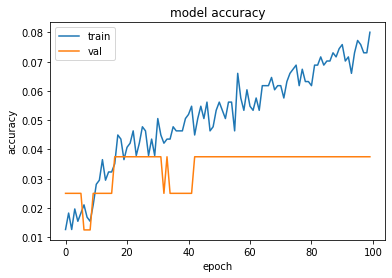

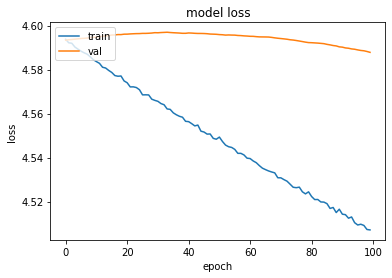

Epoch 1/100
29/29 [==============================] - 1s 17ms/step - loss: 4.5928 - accuracy: 0.0183 - val_loss: 4.5900 - val_accuracy: 0.0125
Epoch 2/100
29/29 [==============================] - 0s 9ms/step - loss: 4.5921 - accuracy: 0.0154 - val_loss: 4.5901 - val_accuracy: 0.0125
Epoch 3/100
29/29 [==============================] - 0s 9ms/step - loss: 4.5909 - accuracy: 0.0169 - val_loss: 4.5902 - val_accuracy: 0.0125
Epoch 4/100
29/29 [==============================] - 0s 10ms/step - loss: 4.5905 - accuracy: 0.0183 - val_loss: 4.5903 - val_accuracy: 0.0250
Epoch 5/100
29/29 [==============================] - 0s 10ms/step - loss: 4.5897 - accuracy: 0.0225 - val_loss: 4.5904 - val_accuracy: 0.0125
Epoch 6/100
29/29 [==============================] - 0s 11ms/step - loss: 4.5888 - accuracy: 0.0267 - val_loss: 4.5905 - val_accuracy: 0.0000e+00
Epoch 7/100
29/29 [==============================] - 0s 10ms/step - loss: 4.5878 - accuracy: 0.0281 - val_loss: 4.5905 - val_accuracy: 0.0000e+00


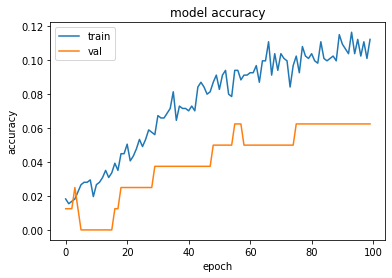

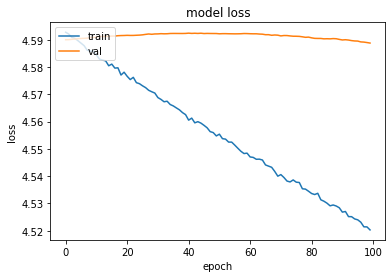

Epoch 1/100
24/24 [==============================] - 1s 21ms/step - loss: 4.5990 - accuracy: 0.0028 - val_loss: 4.5950 - val_accuracy: 0.0000e+00
Epoch 2/100
24/24 [==============================] - 0s 9ms/step - loss: 4.5988 - accuracy: 0.0000e+00 - val_loss: 4.5950 - val_accuracy: 0.0000e+00
Epoch 3/100
24/24 [==============================] - 0s 9ms/step - loss: 4.5984 - accuracy: 0.0056 - val_loss: 4.5951 - val_accuracy: 0.0000e+00
Epoch 4/100
24/24 [==============================] - 0s 8ms/step - loss: 4.5969 - accuracy: 0.0084 - val_loss: 4.5952 - val_accuracy: 0.0000e+00
Epoch 5/100
24/24 [==============================] - 0s 9ms/step - loss: 4.5957 - accuracy: 0.0056 - val_loss: 4.5953 - val_accuracy: 0.0000e+00
Epoch 6/100
24/24 [==============================] - 0s 8ms/step - loss: 4.5959 - accuracy: 0.0070 - val_loss: 4.5955 - val_accuracy: 0.0000e+00
Epoch 7/100
24/24 [==============================] - 0s 7ms/step - loss: 4.5950 - accuracy: 0.0098 - val_loss: 4.5956 - val_a

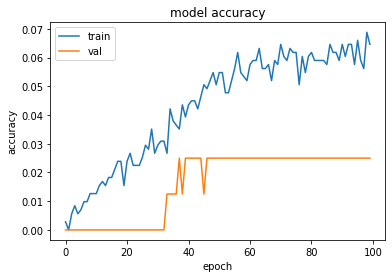

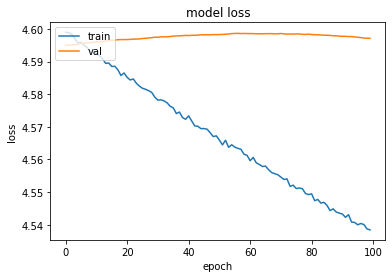

Epoch 1/100
36/36 [==============================] - 2s 20ms/step - loss: 4.5564 - accuracy: 0.0969 - val_loss: 4.4921 - val_accuracy: 0.2875
Epoch 2/100
36/36 [==============================] - 0s 10ms/step - loss: 4.3980 - accuracy: 0.3497 - val_loss: 4.3417 - val_accuracy: 0.3000
Epoch 3/100
36/36 [==============================] - 0s 10ms/step - loss: 4.1699 - accuracy: 0.4494 - val_loss: 4.1043 - val_accuracy: 0.2500
Epoch 4/100
36/36 [==============================] - 0s 9ms/step - loss: 3.8280 - accuracy: 0.4874 - val_loss: 3.7495 - val_accuracy: 0.2750
Epoch 5/100
36/36 [==============================] - 0s 11ms/step - loss: 3.4068 - accuracy: 0.5379 - val_loss: 3.3777 - val_accuracy: 0.3000
Epoch 6/100
36/36 [==============================] - 0s 10ms/step - loss: 2.9694 - accuracy: 0.5716 - val_loss: 3.0301 - val_accuracy: 0.3875
Epoch 7/100
36/36 [==============================] - 0s 10ms/step - loss: 2.5848 - accuracy: 0.6180 - val_loss: 2.7147 - val_accuracy: 0.4625
Epoch 8

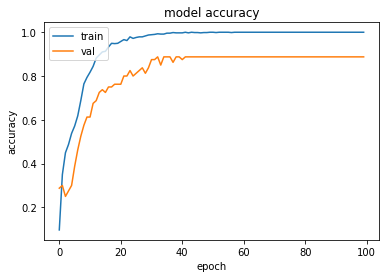

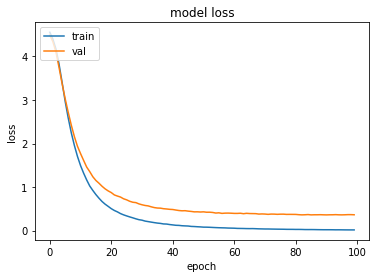

Epoch 1/100
29/29 [==============================] - 1s 19ms/step - loss: 4.5637 - accuracy: 0.0758 - val_loss: 4.5174 - val_accuracy: 0.1375
Epoch 2/100
29/29 [==============================] - 0s 10ms/step - loss: 4.4286 - accuracy: 0.3553 - val_loss: 4.3960 - val_accuracy: 0.2125
Epoch 3/100
29/29 [==============================] - 0s 9ms/step - loss: 4.2478 - accuracy: 0.4466 - val_loss: 4.2104 - val_accuracy: 0.2375
Epoch 4/100
29/29 [==============================] - 0s 11ms/step - loss: 3.9796 - accuracy: 0.4691 - val_loss: 3.9442 - val_accuracy: 0.2125
Epoch 5/100
29/29 [==============================] - 0s 9ms/step - loss: 3.6342 - accuracy: 0.5126 - val_loss: 3.6149 - val_accuracy: 0.2375
Epoch 6/100
29/29 [==============================] - 0s 9ms/step - loss: 3.2541 - accuracy: 0.5239 - val_loss: 3.2841 - val_accuracy: 0.3125
Epoch 7/100
29/29 [==============================] - 0s 9ms/step - loss: 2.8759 - accuracy: 0.5927 - val_loss: 2.9837 - val_accuracy: 0.3875
Epoch 8/10

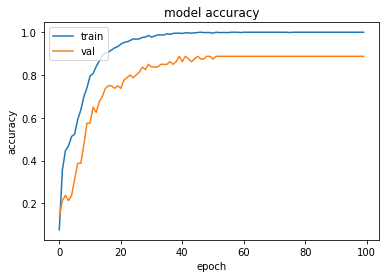

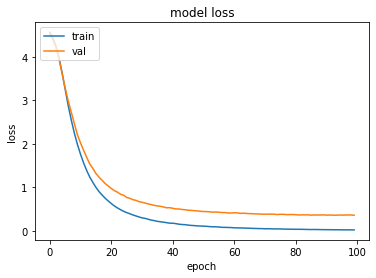

Epoch 1/100
24/24 [==============================] - 2s 67ms/step - loss: 4.5638 - accuracy: 0.0758 - val_loss: 4.5185 - val_accuracy: 0.2000
Epoch 2/100
24/24 [==============================] - 0s 14ms/step - loss: 4.4419 - accuracy: 0.3750 - val_loss: 4.4128 - val_accuracy: 0.2375
Epoch 3/100
24/24 [==============================] - 0s 15ms/step - loss: 4.2888 - accuracy: 0.4312 - val_loss: 4.2581 - val_accuracy: 0.2875
Epoch 4/100
24/24 [==============================] - 0s 15ms/step - loss: 4.0763 - accuracy: 0.4551 - val_loss: 4.0468 - val_accuracy: 0.2625
Epoch 5/100
24/24 [==============================] - 0s 16ms/step - loss: 3.7886 - accuracy: 0.4944 - val_loss: 3.7803 - val_accuracy: 0.2500
Epoch 6/100
24/24 [==============================] - 0s 15ms/step - loss: 3.4513 - accuracy: 0.5239 - val_loss: 3.4753 - val_accuracy: 0.2750
Epoch 7/100
24/24 [==============================] - 0s 15ms/step - loss: 3.1050 - accuracy: 0.5772 - val_loss: 3.1742 - val_accuracy: 0.3625
Epoch 

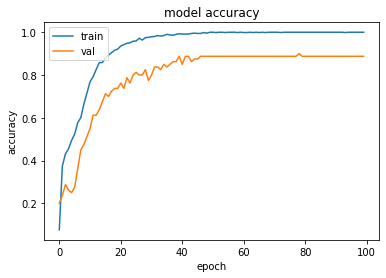

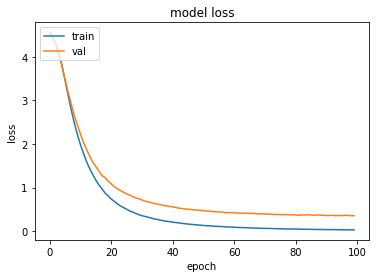

Epoch 1/100
36/36 [==============================] - 2s 22ms/step - loss: 4.5585 - accuracy: 0.0815 - val_loss: 4.5193 - val_accuracy: 0.1500
Epoch 2/100
36/36 [==============================] - 0s 10ms/step - loss: 4.4409 - accuracy: 0.2669 - val_loss: 4.4222 - val_accuracy: 0.2000
Epoch 3/100
36/36 [==============================] - 0s 11ms/step - loss: 4.2936 - accuracy: 0.3385 - val_loss: 4.2815 - val_accuracy: 0.1875
Epoch 4/100
36/36 [==============================] - 0s 10ms/step - loss: 4.0940 - accuracy: 0.3624 - val_loss: 4.1000 - val_accuracy: 0.2125
Epoch 5/100
36/36 [==============================] - 0s 10ms/step - loss: 3.8518 - accuracy: 0.4270 - val_loss: 3.8871 - val_accuracy: 0.2125
Epoch 6/100
36/36 [==============================] - 0s 11ms/step - loss: 3.5891 - accuracy: 0.4368 - val_loss: 3.6653 - val_accuracy: 0.2250
Epoch 7/100
36/36 [==============================] - 0s 10ms/step - loss: 3.3154 - accuracy: 0.4860 - val_loss: 3.4424 - val_accuracy: 0.2625
Epoch 

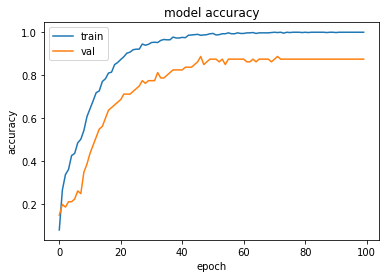

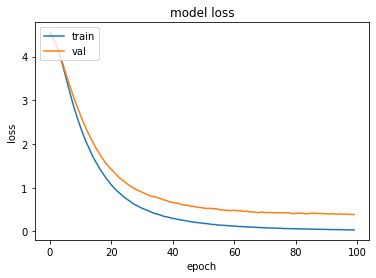

Epoch 1/100
29/29 [==============================] - 1s 18ms/step - loss: 4.5650 - accuracy: 0.0688 - val_loss: 4.5219 - val_accuracy: 0.1500
Epoch 2/100
29/29 [==============================] - 0s 10ms/step - loss: 4.4624 - accuracy: 0.2416 - val_loss: 4.4354 - val_accuracy: 0.2000
Epoch 3/100
29/29 [==============================] - 0s 9ms/step - loss: 4.3393 - accuracy: 0.3483 - val_loss: 4.3234 - val_accuracy: 0.2000
Epoch 4/100
29/29 [==============================] - 0s 9ms/step - loss: 4.1809 - accuracy: 0.3947 - val_loss: 4.1740 - val_accuracy: 0.2375
Epoch 5/100
29/29 [==============================] - 0s 9ms/step - loss: 3.9842 - accuracy: 0.4284 - val_loss: 4.0008 - val_accuracy: 0.2125
Epoch 6/100
29/29 [==============================] - 0s 9ms/step - loss: 3.7592 - accuracy: 0.4438 - val_loss: 3.8058 - val_accuracy: 0.2000
Epoch 7/100
29/29 [==============================] - 0s 9ms/step - loss: 3.5208 - accuracy: 0.4551 - val_loss: 3.6083 - val_accuracy: 0.2000
Epoch 8/100

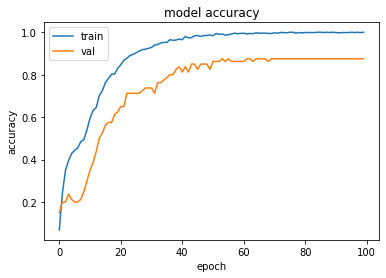

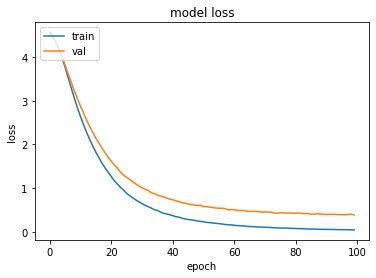

Epoch 1/100
24/24 [==============================] - 1s 23ms/step - loss: 4.5681 - accuracy: 0.0674 - val_loss: 4.5282 - val_accuracy: 0.1500
Epoch 2/100
24/24 [==============================] - 0s 10ms/step - loss: 4.4786 - accuracy: 0.2472 - val_loss: 4.4538 - val_accuracy: 0.2750
Epoch 3/100
24/24 [==============================] - 0s 10ms/step - loss: 4.3757 - accuracy: 0.3146 - val_loss: 4.3564 - val_accuracy: 0.2625
Epoch 4/100
24/24 [==============================] - 0s 10ms/step - loss: 4.2439 - accuracy: 0.3750 - val_loss: 4.2312 - val_accuracy: 0.2250
Epoch 5/100
24/24 [==============================] - 0s 9ms/step - loss: 4.0825 - accuracy: 0.3961 - val_loss: 4.0804 - val_accuracy: 0.2375
Epoch 6/100
24/24 [==============================] - 0s 10ms/step - loss: 3.8938 - accuracy: 0.3989 - val_loss: 3.9123 - val_accuracy: 0.2375
Epoch 7/100
24/24 [==============================] - 0s 10ms/step - loss: 3.6873 - accuracy: 0.4242 - val_loss: 3.7282 - val_accuracy: 0.2375
Epoch 8

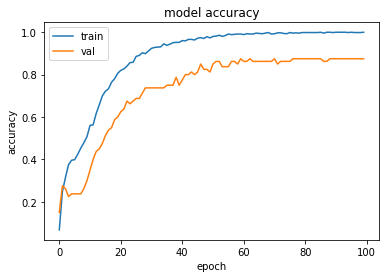

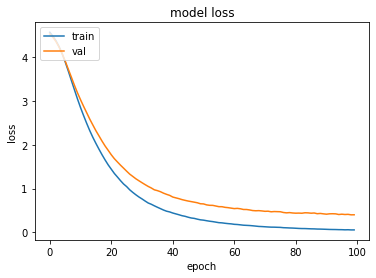

Epoch 1/100
36/36 [==============================] - 1s 18ms/step - loss: 4.5968 - accuracy: 0.0112 - val_loss: 4.5960 - val_accuracy: 0.0125
Epoch 2/100
36/36 [==============================] - 0s 8ms/step - loss: 4.5954 - accuracy: 0.0056 - val_loss: 4.5961 - val_accuracy: 0.0125
Epoch 3/100
36/36 [==============================] - 0s 7ms/step - loss: 4.5939 - accuracy: 0.0140 - val_loss: 4.5964 - val_accuracy: 0.0125
Epoch 4/100
36/36 [==============================] - 0s 7ms/step - loss: 4.5926 - accuracy: 0.0183 - val_loss: 4.5964 - val_accuracy: 0.0125
Epoch 5/100
36/36 [==============================] - 0s 9ms/step - loss: 4.5925 - accuracy: 0.0084 - val_loss: 4.5964 - val_accuracy: 0.0125
Epoch 6/100
36/36 [==============================] - 0s 10ms/step - loss: 4.5900 - accuracy: 0.0140 - val_loss: 4.5966 - val_accuracy: 0.0125
Epoch 7/100
36/36 [==============================] - 0s 9ms/step - loss: 4.5892 - accuracy: 0.0126 - val_loss: 4.5967 - val_accuracy: 0.0125
Epoch 8/100

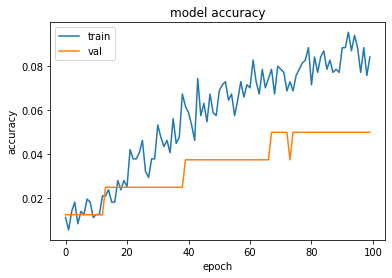

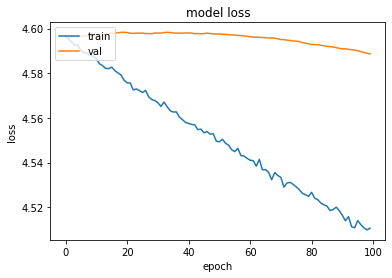

Epoch 1/100
29/29 [==============================] - 1s 18ms/step - loss: 4.5931 - accuracy: 0.0070 - val_loss: 4.5948 - val_accuracy: 0.0250
Epoch 2/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5911 - accuracy: 0.0098 - val_loss: 4.5950 - val_accuracy: 0.0250
Epoch 3/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5924 - accuracy: 0.0126 - val_loss: 4.5952 - val_accuracy: 0.0250
Epoch 4/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5905 - accuracy: 0.0183 - val_loss: 4.5954 - val_accuracy: 0.0250
Epoch 5/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5893 - accuracy: 0.0126 - val_loss: 4.5955 - val_accuracy: 0.0250
Epoch 6/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5879 - accuracy: 0.0197 - val_loss: 4.5957 - val_accuracy: 0.0250
Epoch 7/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5883 - accuracy: 0.0197 - val_loss: 4.5958 - val_accuracy: 0.0250
Epoch 8/100


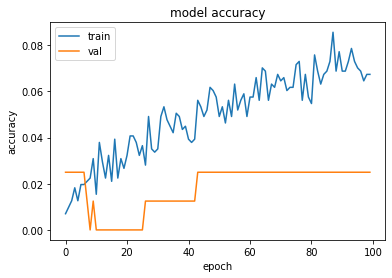

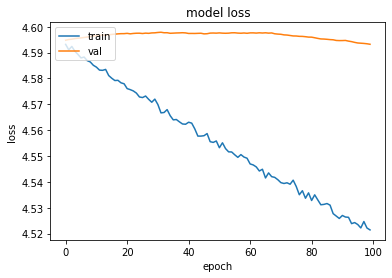

Epoch 1/100
24/24 [==============================] - 1s 20ms/step - loss: 4.5917 - accuracy: 0.0028 - val_loss: 4.5958 - val_accuracy: 0.0125
Epoch 2/100
24/24 [==============================] - 0s 9ms/step - loss: 4.5920 - accuracy: 0.0070 - val_loss: 4.5959 - val_accuracy: 0.0125
Epoch 3/100
24/24 [==============================] - 0s 9ms/step - loss: 4.5906 - accuracy: 0.0112 - val_loss: 4.5959 - val_accuracy: 0.0125
Epoch 4/100
24/24 [==============================] - 0s 8ms/step - loss: 4.5898 - accuracy: 0.0070 - val_loss: 4.5961 - val_accuracy: 0.0125
Epoch 5/100
24/24 [==============================] - 0s 8ms/step - loss: 4.5892 - accuracy: 0.0154 - val_loss: 4.5962 - val_accuracy: 0.0250
Epoch 6/100
24/24 [==============================] - 0s 9ms/step - loss: 4.5892 - accuracy: 0.0056 - val_loss: 4.5963 - val_accuracy: 0.0250
Epoch 7/100
24/24 [==============================] - 0s 9ms/step - loss: 4.5877 - accuracy: 0.0225 - val_loss: 4.5965 - val_accuracy: 0.0250
Epoch 8/100


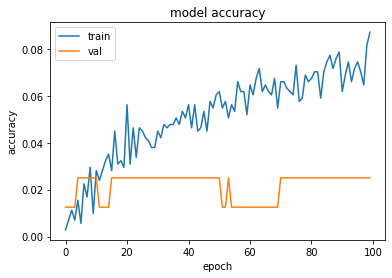

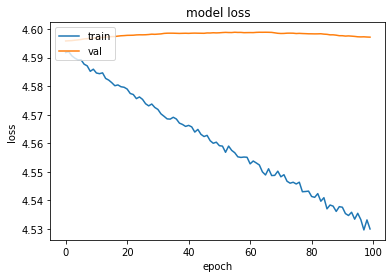

Epoch 1/100
36/36 [==============================] - 1s 15ms/step - loss: 4.5652 - accuracy: 0.0632 - val_loss: 4.5174 - val_accuracy: 0.2500
Epoch 2/100
36/36 [==============================] - 0s 9ms/step - loss: 4.4271 - accuracy: 0.2935 - val_loss: 4.3958 - val_accuracy: 0.2750
Epoch 3/100
36/36 [==============================] - 0s 8ms/step - loss: 4.2449 - accuracy: 0.3890 - val_loss: 4.1996 - val_accuracy: 0.2375
Epoch 4/100
36/36 [==============================] - 0s 8ms/step - loss: 3.9747 - accuracy: 0.4480 - val_loss: 3.9319 - val_accuracy: 0.2375
Epoch 5/100
36/36 [==============================] - 0s 8ms/step - loss: 3.6292 - accuracy: 0.4705 - val_loss: 3.6133 - val_accuracy: 0.3125
Epoch 6/100
36/36 [==============================] - 0s 8ms/step - loss: 3.2433 - accuracy: 0.5197 - val_loss: 3.2849 - val_accuracy: 0.3125
Epoch 7/100
36/36 [==============================] - 0s 8ms/step - loss: 2.8775 - accuracy: 0.5478 - val_loss: 2.9778 - val_accuracy: 0.4000
Epoch 8/100


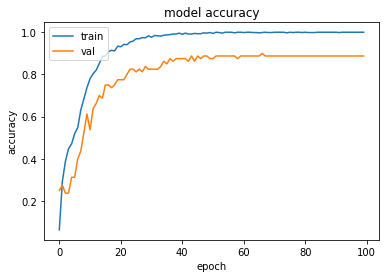

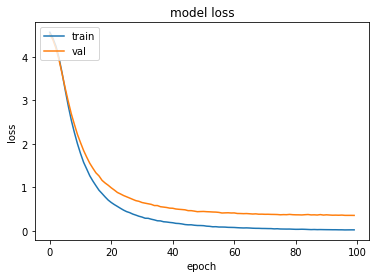

Epoch 1/100
29/29 [==============================] - 1s 19ms/step - loss: 4.5629 - accuracy: 0.0758 - val_loss: 4.5185 - val_accuracy: 0.1750
Epoch 2/100
29/29 [==============================] - 0s 10ms/step - loss: 4.4432 - accuracy: 0.3062 - val_loss: 4.4150 - val_accuracy: 0.2250
Epoch 3/100
29/29 [==============================] - 0s 9ms/step - loss: 4.2875 - accuracy: 0.4115 - val_loss: 4.2560 - val_accuracy: 0.2375
Epoch 4/100
29/29 [==============================] - 0s 9ms/step - loss: 4.0717 - accuracy: 0.4242 - val_loss: 4.0333 - val_accuracy: 0.2375
Epoch 5/100
29/29 [==============================] - 0s 9ms/step - loss: 3.7861 - accuracy: 0.4817 - val_loss: 3.7710 - val_accuracy: 0.2500
Epoch 6/100
29/29 [==============================] - 0s 9ms/step - loss: 3.4545 - accuracy: 0.4972 - val_loss: 3.4661 - val_accuracy: 0.2500
Epoch 7/100
29/29 [==============================] - 0s 9ms/step - loss: 3.1070 - accuracy: 0.5590 - val_loss: 3.1678 - val_accuracy: 0.3250
Epoch 8/100

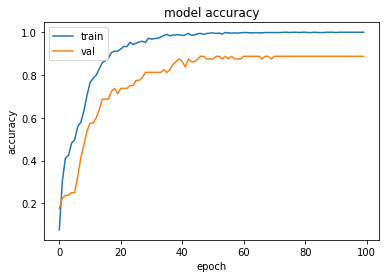

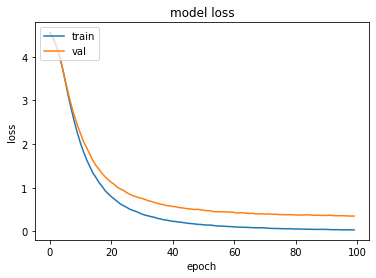

Epoch 1/100
24/24 [==============================] - 2s 23ms/step - loss: 4.5681 - accuracy: 0.0562 - val_loss: 4.5352 - val_accuracy: 0.1125
Epoch 2/100
24/24 [==============================] - 0s 14ms/step - loss: 4.4628 - accuracy: 0.2598 - val_loss: 4.4506 - val_accuracy: 0.1750
Epoch 3/100
24/24 [==============================] - 0s 13ms/step - loss: 4.3408 - accuracy: 0.3961 - val_loss: 4.3305 - val_accuracy: 0.2125
Epoch 4/100
24/24 [==============================] - 0s 12ms/step - loss: 4.1704 - accuracy: 0.4003 - val_loss: 4.1630 - val_accuracy: 0.2125
Epoch 5/100
24/24 [==============================] - 0s 14ms/step - loss: 3.9454 - accuracy: 0.4761 - val_loss: 3.9357 - val_accuracy: 0.2375
Epoch 6/100
24/24 [==============================] - 0s 14ms/step - loss: 3.6679 - accuracy: 0.4972 - val_loss: 3.6826 - val_accuracy: 0.2875
Epoch 7/100
24/24 [==============================] - 0s 14ms/step - loss: 3.3679 - accuracy: 0.5435 - val_loss: 3.4183 - val_accuracy: 0.3250
Epoch 

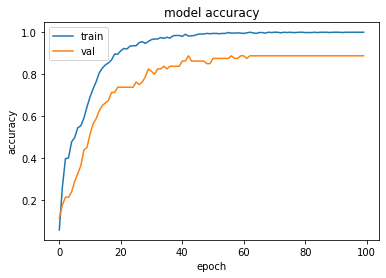

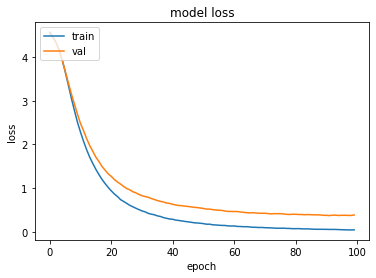

Epoch 1/100
36/36 [==============================] - 2s 20ms/step - loss: 4.5604 - accuracy: 0.0913 - val_loss: 4.5206 - val_accuracy: 0.1625
Epoch 2/100
36/36 [==============================] - 0s 9ms/step - loss: 4.4586 - accuracy: 0.2247 - val_loss: 4.4332 - val_accuracy: 0.2250
Epoch 3/100
36/36 [==============================] - 0s 10ms/step - loss: 4.3330 - accuracy: 0.3034 - val_loss: 4.3197 - val_accuracy: 0.2375
Epoch 4/100
36/36 [==============================] - 0s 10ms/step - loss: 4.1761 - accuracy: 0.3750 - val_loss: 4.1719 - val_accuracy: 0.2250
Epoch 5/100
36/36 [==============================] - 0s 9ms/step - loss: 3.9761 - accuracy: 0.3848 - val_loss: 3.9917 - val_accuracy: 0.2125
Epoch 6/100
36/36 [==============================] - 0s 9ms/step - loss: 3.7545 - accuracy: 0.4143 - val_loss: 3.7984 - val_accuracy: 0.2250
Epoch 7/100
36/36 [==============================] - 0s 11ms/step - loss: 3.5223 - accuracy: 0.4494 - val_loss: 3.6036 - val_accuracy: 0.2250
Epoch 8/1

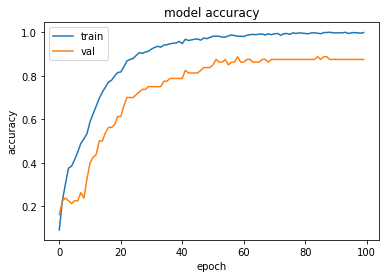

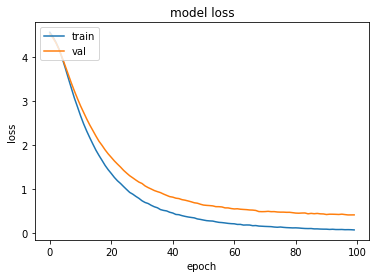

Epoch 1/100
29/29 [==============================] - 1s 18ms/step - loss: 4.5639 - accuracy: 0.0604 - val_loss: 4.5238 - val_accuracy: 0.1250
Epoch 2/100
29/29 [==============================] - 0s 8ms/step - loss: 4.4758 - accuracy: 0.2275 - val_loss: 4.4506 - val_accuracy: 0.2250
Epoch 3/100
29/29 [==============================] - 0s 9ms/step - loss: 4.3734 - accuracy: 0.3385 - val_loss: 4.3559 - val_accuracy: 0.2250
Epoch 4/100
29/29 [==============================] - 0s 9ms/step - loss: 4.2401 - accuracy: 0.3694 - val_loss: 4.2353 - val_accuracy: 0.2250
Epoch 5/100
29/29 [==============================] - 0s 8ms/step - loss: 4.0828 - accuracy: 0.4087 - val_loss: 4.0865 - val_accuracy: 0.2500
Epoch 6/100
29/29 [==============================] - 0s 8ms/step - loss: 3.8918 - accuracy: 0.4354 - val_loss: 3.9206 - val_accuracy: 0.2500
Epoch 7/100
29/29 [==============================] - 0s 8ms/step - loss: 3.6912 - accuracy: 0.4480 - val_loss: 3.7517 - val_accuracy: 0.2750
Epoch 8/100


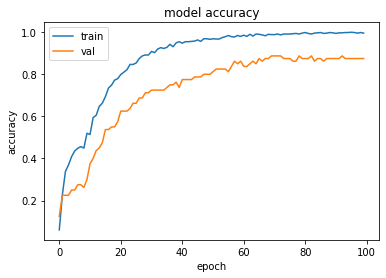

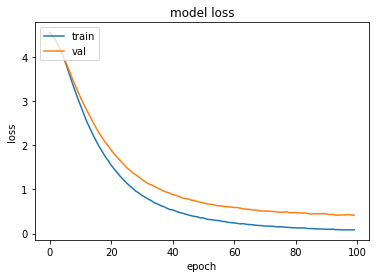

Epoch 1/100
24/24 [==============================] - 1s 22ms/step - loss: 4.5729 - accuracy: 0.0534 - val_loss: 4.5371 - val_accuracy: 0.2750
Epoch 2/100
24/24 [==============================] - 0s 9ms/step - loss: 4.4960 - accuracy: 0.2261 - val_loss: 4.4741 - val_accuracy: 0.2875
Epoch 3/100
24/24 [==============================] - 0s 8ms/step - loss: 4.4063 - accuracy: 0.3652 - val_loss: 4.3944 - val_accuracy: 0.3000
Epoch 4/100
24/24 [==============================] - 0s 10ms/step - loss: 4.3010 - accuracy: 0.3708 - val_loss: 4.2967 - val_accuracy: 0.2750
Epoch 5/100
24/24 [==============================] - 0s 10ms/step - loss: 4.1665 - accuracy: 0.4101 - val_loss: 4.1747 - val_accuracy: 0.2750
Epoch 6/100
24/24 [==============================] - 0s 11ms/step - loss: 4.0155 - accuracy: 0.4185 - val_loss: 4.0353 - val_accuracy: 0.2625
Epoch 7/100
24/24 [==============================] - 0s 11ms/step - loss: 3.8381 - accuracy: 0.4579 - val_loss: 3.8810 - val_accuracy: 0.2625
Epoch 8/

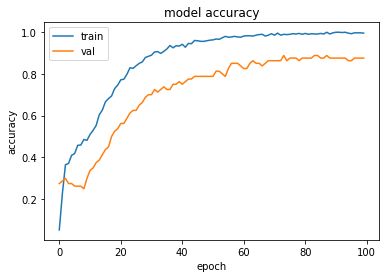

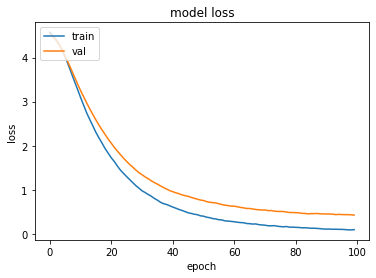

Epoch 1/100
36/36 [==============================] - 1s 14ms/step - loss: 4.5955 - accuracy: 0.0070 - val_loss: 4.5944 - val_accuracy: 0.0000e+00
Epoch 2/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5948 - accuracy: 0.0070 - val_loss: 4.5945 - val_accuracy: 0.0000e+00
Epoch 3/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5917 - accuracy: 0.0098 - val_loss: 4.5945 - val_accuracy: 0.0000e+00
Epoch 4/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5907 - accuracy: 0.0028 - val_loss: 4.5950 - val_accuracy: 0.0000e+00
Epoch 5/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5924 - accuracy: 0.0084 - val_loss: 4.5951 - val_accuracy: 0.0000e+00
Epoch 6/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5908 - accuracy: 0.0154 - val_loss: 4.5954 - val_accuracy: 0.0000e+00
Epoch 7/100
36/36 [==============================] - 0s 6ms/step - loss: 4.5885 - accuracy: 0.0098 - val_loss: 4.5957 - val_accur

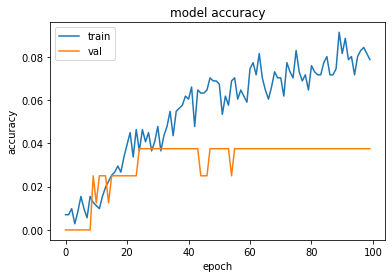

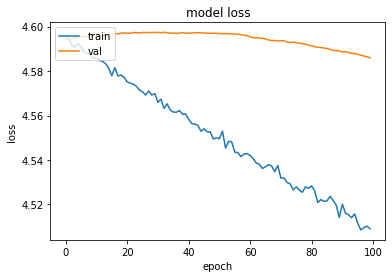

Epoch 1/100
29/29 [==============================] - 1s 17ms/step - loss: 4.5989 - accuracy: 0.0056 - val_loss: 4.6003 - val_accuracy: 0.0000e+00
Epoch 2/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5985 - accuracy: 0.0098 - val_loss: 4.6004 - val_accuracy: 0.0000e+00
Epoch 3/100
29/29 [==============================] - 0s 6ms/step - loss: 4.5968 - accuracy: 0.0042 - val_loss: 4.6004 - val_accuracy: 0.0000e+00
Epoch 4/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5962 - accuracy: 0.0098 - val_loss: 4.6006 - val_accuracy: 0.0000e+00
Epoch 5/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5928 - accuracy: 0.0140 - val_loss: 4.6009 - val_accuracy: 0.0000e+00
Epoch 6/100
29/29 [==============================] - 0s 8ms/step - loss: 4.5945 - accuracy: 0.0070 - val_loss: 4.6008 - val_accuracy: 0.0000e+00
Epoch 7/100
29/29 [==============================] - 0s 7ms/step - loss: 4.5931 - accuracy: 0.0084 - val_loss: 4.6009 - val_accur

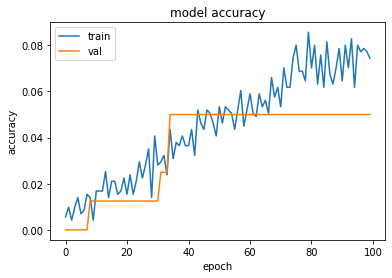

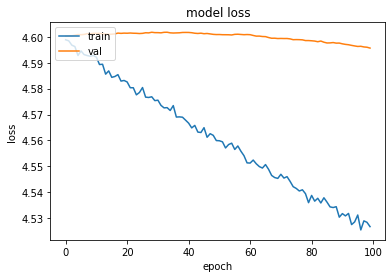

Epoch 1/100
24/24 [==============================] - 1s 21ms/step - loss: 4.5932 - accuracy: 0.0140 - val_loss: 4.5985 - val_accuracy: 0.0000e+00
Epoch 2/100
24/24 [==============================] - 0s 11ms/step - loss: 4.5921 - accuracy: 0.0154 - val_loss: 4.5987 - val_accuracy: 0.0125
Epoch 3/100
24/24 [==============================] - 0s 10ms/step - loss: 4.5909 - accuracy: 0.0098 - val_loss: 4.5988 - val_accuracy: 0.0125
Epoch 4/100
24/24 [==============================] - 0s 12ms/step - loss: 4.5913 - accuracy: 0.0056 - val_loss: 4.5988 - val_accuracy: 0.0125
Epoch 5/100
24/24 [==============================] - 0s 11ms/step - loss: 4.5895 - accuracy: 0.0126 - val_loss: 4.5990 - val_accuracy: 0.0125
Epoch 6/100
24/24 [==============================] - 0s 11ms/step - loss: 4.5898 - accuracy: 0.0183 - val_loss: 4.5993 - val_accuracy: 0.0250
Epoch 7/100
24/24 [==============================] - 0s 9ms/step - loss: 4.5888 - accuracy: 0.0211 - val_loss: 4.5995 - val_accuracy: 0.0125
Epo

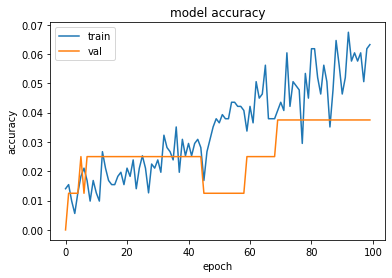

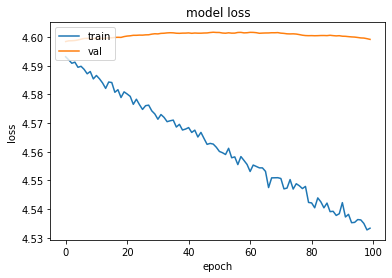

Epoch 1/100
36/36 [==============================] - 1s 16ms/step - loss: 4.5710 - accuracy: 0.0407 - val_loss: 4.5225 - val_accuracy: 0.0750
Epoch 2/100
36/36 [==============================] - 0s 8ms/step - loss: 4.4565 - accuracy: 0.2121 - val_loss: 4.4369 - val_accuracy: 0.1125
Epoch 3/100
36/36 [==============================] - 0s 8ms/step - loss: 4.3201 - accuracy: 0.3483 - val_loss: 4.3023 - val_accuracy: 0.2375
Epoch 4/100
36/36 [==============================] - 0s 9ms/step - loss: 4.1330 - accuracy: 0.3890 - val_loss: 4.1130 - val_accuracy: 0.2375
Epoch 5/100
36/36 [==============================] - 0s 9ms/step - loss: 3.8709 - accuracy: 0.4368 - val_loss: 3.8690 - val_accuracy: 0.2500
Epoch 6/100
36/36 [==============================] - 0s 8ms/step - loss: 3.5719 - accuracy: 0.4902 - val_loss: 3.6048 - val_accuracy: 0.2375
Epoch 7/100
36/36 [==============================] - 0s 8ms/step - loss: 3.2569 - accuracy: 0.4944 - val_loss: 3.3419 - val_accuracy: 0.2750
Epoch 8/100


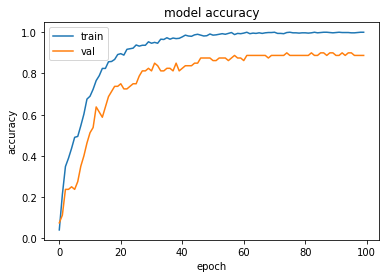

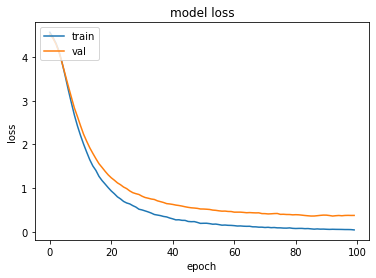

Epoch 1/100
29/29 [==============================] - 1s 18ms/step - loss: 4.5705 - accuracy: 0.0506 - val_loss: 4.5315 - val_accuracy: 0.1250
Epoch 2/100
29/29 [==============================] - 0s 9ms/step - loss: 4.4756 - accuracy: 0.1966 - val_loss: 4.4608 - val_accuracy: 0.1750
Epoch 3/100
29/29 [==============================] - 0s 9ms/step - loss: 4.3584 - accuracy: 0.3483 - val_loss: 4.3584 - val_accuracy: 0.2125
Epoch 4/100
29/29 [==============================] - 0s 10ms/step - loss: 4.2090 - accuracy: 0.4185 - val_loss: 4.1977 - val_accuracy: 0.2625
Epoch 5/100
29/29 [==============================] - 0s 10ms/step - loss: 4.0149 - accuracy: 0.4270 - val_loss: 4.0144 - val_accuracy: 0.2625
Epoch 6/100
29/29 [==============================] - 0s 10ms/step - loss: 3.7607 - accuracy: 0.4775 - val_loss: 3.7779 - val_accuracy: 0.2500
Epoch 7/100
29/29 [==============================] - 0s 9ms/step - loss: 3.4921 - accuracy: 0.4860 - val_loss: 3.5488 - val_accuracy: 0.3000
Epoch 8/1

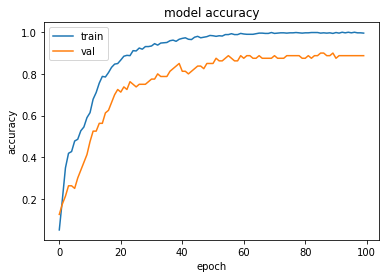

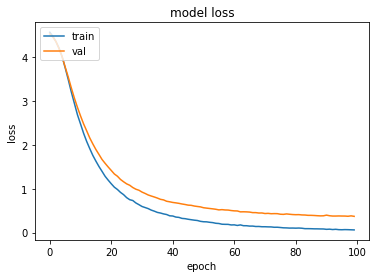

Epoch 1/100
24/24 [==============================] - 1s 23ms/step - loss: 4.5753 - accuracy: 0.0435 - val_loss: 4.5481 - val_accuracy: 0.1125
Epoch 2/100
24/24 [==============================] - 0s 10ms/step - loss: 4.4901 - accuracy: 0.1798 - val_loss: 4.4839 - val_accuracy: 0.1000
Epoch 3/100
24/24 [==============================] - 0s 10ms/step - loss: 4.3949 - accuracy: 0.2879 - val_loss: 4.3980 - val_accuracy: 0.1750
Epoch 4/100
24/24 [==============================] - 0s 10ms/step - loss: 4.2665 - accuracy: 0.3441 - val_loss: 4.2779 - val_accuracy: 0.1875
Epoch 5/100
24/24 [==============================] - 0s 12ms/step - loss: 4.1045 - accuracy: 0.3610 - val_loss: 4.1220 - val_accuracy: 0.1750
Epoch 6/100
24/24 [==============================] - 0s 10ms/step - loss: 3.8974 - accuracy: 0.3947 - val_loss: 3.9287 - val_accuracy: 0.2125
Epoch 7/100
24/24 [==============================] - 0s 11ms/step - loss: 3.6678 - accuracy: 0.4410 - val_loss: 3.7185 - val_accuracy: 0.2125
Epoch 

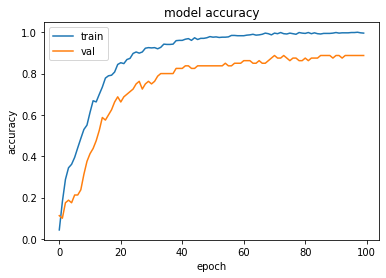

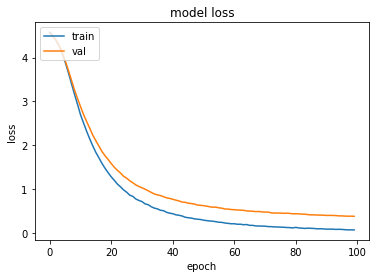

Epoch 1/100
36/36 [==============================] - 2s 17ms/step - loss: 4.5751 - accuracy: 0.0407 - val_loss: 4.5365 - val_accuracy: 0.2125
Epoch 2/100
36/36 [==============================] - 0s 8ms/step - loss: 4.4902 - accuracy: 0.2149 - val_loss: 4.4729 - val_accuracy: 0.2250
Epoch 3/100
36/36 [==============================] - 0s 8ms/step - loss: 4.4084 - accuracy: 0.2683 - val_loss: 4.3941 - val_accuracy: 0.2000
Epoch 4/100
36/36 [==============================] - 0s 8ms/step - loss: 4.2903 - accuracy: 0.3329 - val_loss: 4.2925 - val_accuracy: 0.2125
Epoch 5/100
36/36 [==============================] - 0s 8ms/step - loss: 4.1493 - accuracy: 0.3343 - val_loss: 4.1644 - val_accuracy: 0.2125
Epoch 6/100
36/36 [==============================] - 0s 8ms/step - loss: 3.9915 - accuracy: 0.3876 - val_loss: 4.0217 - val_accuracy: 0.2375
Epoch 7/100
36/36 [==============================] - 0s 8ms/step - loss: 3.8151 - accuracy: 0.4284 - val_loss: 3.8679 - val_accuracy: 0.2375
Epoch 8/100


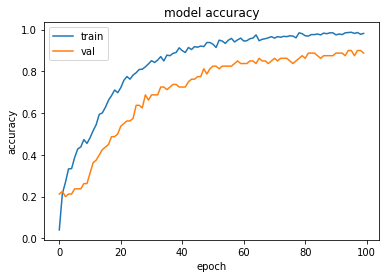

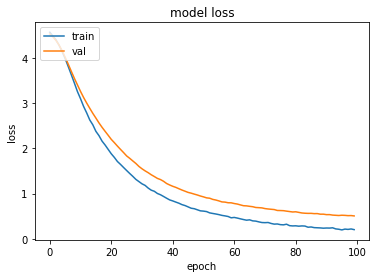

Epoch 1/100
29/29 [==============================] - 1s 20ms/step - loss: 4.5745 - accuracy: 0.0506 - val_loss: 4.5460 - val_accuracy: 0.1625
Epoch 2/100
29/29 [==============================] - 0s 10ms/step - loss: 4.5018 - accuracy: 0.1713 - val_loss: 4.4919 - val_accuracy: 0.1875
Epoch 3/100
29/29 [==============================] - 0s 9ms/step - loss: 4.4225 - accuracy: 0.2697 - val_loss: 4.4264 - val_accuracy: 0.2000
Epoch 4/100
29/29 [==============================] - 0s 9ms/step - loss: 4.3289 - accuracy: 0.3230 - val_loss: 4.3442 - val_accuracy: 0.1875
Epoch 5/100
29/29 [==============================] - 0s 8ms/step - loss: 4.2119 - accuracy: 0.3680 - val_loss: 4.2425 - val_accuracy: 0.1750
Epoch 6/100
29/29 [==============================] - 0s 10ms/step - loss: 4.0751 - accuracy: 0.3441 - val_loss: 4.1175 - val_accuracy: 0.2000
Epoch 7/100
29/29 [==============================] - 0s 9ms/step - loss: 3.9304 - accuracy: 0.3764 - val_loss: 3.9834 - val_accuracy: 0.2000
Epoch 8/10

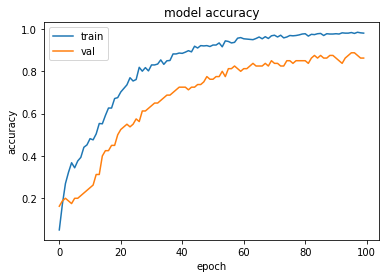

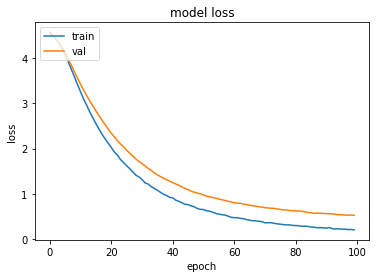

Epoch 1/100
24/24 [==============================] - 2s 30ms/step - loss: 4.5768 - accuracy: 0.0421 - val_loss: 4.5525 - val_accuracy: 0.0875
Epoch 2/100
24/24 [==============================] - 0s 13ms/step - loss: 4.5080 - accuracy: 0.1742 - val_loss: 4.5070 - val_accuracy: 0.1875
Epoch 3/100
24/24 [==============================] - 0s 14ms/step - loss: 4.4418 - accuracy: 0.2444 - val_loss: 4.4485 - val_accuracy: 0.1750
Epoch 4/100
24/24 [==============================] - 0s 10ms/step - loss: 4.3568 - accuracy: 0.3371 - val_loss: 4.3786 - val_accuracy: 0.1875
Epoch 5/100
24/24 [==============================] - 0s 11ms/step - loss: 4.2586 - accuracy: 0.3511 - val_loss: 4.2901 - val_accuracy: 0.1750
Epoch 6/100
24/24 [==============================] - 0s 10ms/step - loss: 4.1419 - accuracy: 0.3862 - val_loss: 4.1883 - val_accuracy: 0.1750
Epoch 7/100
24/24 [==============================] - 0s 9ms/step - loss: 4.0120 - accuracy: 0.3876 - val_loss: 4.0732 - val_accuracy: 0.1875
Epoch 8

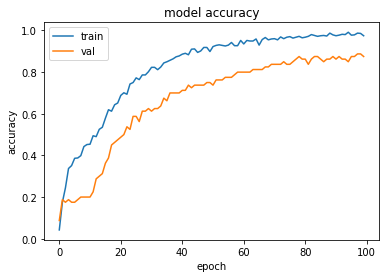

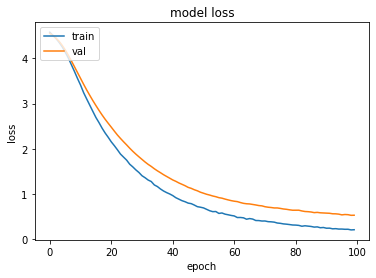

In [30]:
#try combination for 4 hyperparameters 
hidden_size = [128,256,512]
drop = [.2,.4,.6]
opt = ['SGD','adam','RMSProp']
batches = [20,25,30]

results = []

for i in hidden_size:
  for j in drop:
    for k in opt:
      for l in batches:
        model = Sequential()
        model.add(Dense(i, activation='tanh',kernel_initializer='glorot_uniform',input_shape=(X_train.shape[1],)))
        model.add(Dropout(j))
        model.add(Dense(99, activation='softmax'))

        model.compile( loss='CategoricalCrossentropy',optimizer= k, metrics=['accuracy'])

        modell = model.fit(X_train, y_train, epochs = 100, validation_split = 0.1,batch_size = l,shuffle=True)
        model.summary()
        model.evaluate(X_test, y_test)        
        print(f"Hidden size: {i}, dropout: {j}, Optimizer: {k}, Batch size: {l}")
        plot_acuraccy(model)
        plot_loss(model)
